<a href="https://colab.research.google.com/github/x22185101/Machinelearning/blob/main/Team_1_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Libraries

In [1]:
# Import libraries
import numpy as np # for linear algebra
import pandas as pd # for data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns # for data visualization
import matplotlib.pyplot as plt # to plot data visualization charts
from collections import Counter
import os
import statsmodels.api as sm


# Modeling Libraries
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score
from sklearn.preprocessing import QuantileTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve, train_test_split
from sklearn.svm import SVC

# Dataset1

Reading Dataset 1

In [2]:
data1 = pd.read_csv("processed-data.csv")
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 316800 entries, 0 to 316799
Data columns (total 18 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Tiredness                316800 non-null  int64  
 1   Dry-Cough                316795 non-null  float64
 2   Difficulty-in-Breathing  316795 non-null  float64
 3   Sore-Throat              316795 non-null  float64
 4   None_Sympton             316795 non-null  float64
 5   Pains                    316795 non-null  float64
 6   Runny-Nose               316795 non-null  float64
 7   None_Experiencing        316795 non-null  float64
 8   Age_0-9                  316795 non-null  float64
 9   Age_10-19                316795 non-null  float64
 10  Age_20-24                316795 non-null  float64
 11  Age_25-59                316795 non-null  float64
 12  Age_60+                  316795 non-null  float64
 13  Gender_Female            316795 non-null  float64
 14  Gend

Data Cleaning ( Dataset1)

Checking each column and displaying unique values

In [3]:
# Iterate through each column and display unique values
for column in data1.columns:
    unique_values = data1[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Tiredness
[   1    0 1000]

Column: Dry-Cough
[   1.    0. 1000.   nan]

Column: Difficulty-in-Breathing
[   1.    0. 1000.   nan]

Column: Sore-Throat
[   1.    0. 1000.   nan]

Column: None_Sympton
[   0. 1000.    1.   nan]

Column: Pains
[   1.    0. 1000.   nan]

Column: Runny-Nose
[   1.    0. 1000.   nan]

Column: None_Experiencing
[   0.    1. 1000.   nan]

Column: Age_0-9
[   1. 1000.    0.   nan]

Column: Age_10-19
[   0. 1000.    1.   nan]

Column: Age_20-24
[   0. 1000.    1.   nan]

Column: Age_25-59
[   0. 1000.    1.   nan]

Column: Age_60+
[   0. 1000.    1.   nan]

Column: Gender_Female
[   0. 1000.    1.   nan]

Column: Gender_Male
[   1. 1000.    0.   nan]

Column: Severity_Mild
[   1.    0. 1000.   nan]

Column: Severity_Moderate
[   0.    1. 1000.   nan]

Column: Severity_None
[   0.    1. 1000.   nan]



Finding the count of missing values

In [4]:
data1.isnull().sum()

Tiredness                  0
Dry-Cough                  5
Difficulty-in-Breathing    5
Sore-Throat                5
None_Sympton               5
Pains                      5
Runny-Nose                 5
None_Experiencing          5
Age_0-9                    5
Age_10-19                  5
Age_20-24                  5
Age_25-59                  5
Age_60+                    5
Gender_Female              5
Gender_Male                5
Severity_Mild              5
Severity_Moderate          5
Severity_None              5
dtype: int64

Checking all columns where they are -1 or Nan

In [5]:
# Check rows where all columns is -1 or NaN and display related columns
related_columns = ['Tiredness', 'Dry-Cough', 'Difficulty-in-Breathing', 'Sore-Throat', 'None_Sympton', 'Pains', 'Runny-Nose', 'None_Experiencing',
                   'Age_0-9', 'Age_10-19', 'Age_20-24', 'Age_25-59', 'Age_60+', 'Gender_Female', 'Gender_Male', 'Severity_Mild', 'Severity_Moderate', 'Severity_None']

related_data = data1[(data1['Dry-Cough'].isna()) | data1['Difficulty-in-Breathing'].isna() | data1['Sore-Throat'].isna() | data1['None_Sympton'].isna() | data1['Pains'].isna() | data1['Runny-Nose'].isna() | data1['None_Experiencing'].isna() | data1['Age_0-9'].isna() | data1['Age_10-19'].isna() | data1['Age_20-24'].isna() | data1['Age_25-59'].isna() | data1['Age_60+'].isna() | data1['Gender_Female'].isna() | data1['Gender_Male'].isna() | data1['Severity_Mild'].isna() | data1['Severity_Moderate'].isna() | data1['Severity_None'].isna() ][related_columns]
print(related_data)


        Tiredness  Dry-Cough  Difficulty-in-Breathing  Sore-Throat  \
34998           0        NaN                      NaN          NaN   
69998           1        NaN                      NaN          NaN   
99998           1        NaN                      NaN          NaN   
149998          1        NaN                      NaN          NaN   
249998          1        NaN                      NaN          NaN   

        None_Sympton  Pains  Runny-Nose  None_Experiencing  Age_0-9  \
34998            NaN    NaN         NaN                NaN      NaN   
69998            NaN    NaN         NaN                NaN      NaN   
99998            NaN    NaN         NaN                NaN      NaN   
149998           NaN    NaN         NaN                NaN      NaN   
249998           NaN    NaN         NaN                NaN      NaN   

        Age_10-19  Age_20-24  Age_25-59  Age_60+  Gender_Female  Gender_Male  \
34998         NaN        NaN        NaN      NaN            NaN         

The NAN is in all of the columns except one so these rows cannot be used, hence dropping them

Remove rows with missing values from the Dataset1

In [6]:
data1 = data1.dropna()
print(f"No. of Null rows after deleting null rows: {data1.isnull().sum()}")

No. of Null rows after deleting null rows: Tiredness                  0
Dry-Cough                  0
Difficulty-in-Breathing    0
Sore-Throat                0
None_Sympton               0
Pains                      0
Runny-Nose                 0
None_Experiencing          0
Age_0-9                    0
Age_10-19                  0
Age_20-24                  0
Age_25-59                  0
Age_60+                    0
Gender_Female              0
Gender_Male                0
Severity_Mild              0
Severity_Moderate          0
Severity_None              0
dtype: int64


In [7]:
# Iterate through each column and display value counts
for column in data1.columns:
    print(f"Column: {column}")
    print(data1[column].value_counts())
    print()

Column: Tiredness
Tiredness
0       158396
1       158394
1000         5
Name: count, dtype: int64

Column: Dry-Cough
Dry-Cough
1.0       178191
0.0       138599
1000.0         5
Name: count, dtype: int64

Column: Difficulty-in-Breathing
Difficulty-in-Breathing
1.0       158396
0.0       158394
1000.0         5
Name: count, dtype: int64

Column: Sore-Throat
Sore-Throat
0.0       217794
1.0        98996
1000.0         5
Name: count, dtype: int64

Column: None_Sympton
None_Sympton
0.0       296991
1.0        19799
1000.0         5
Name: count, dtype: int64

Column: Pains
Pains
0.0       201595
1.0       115195
1000.0         5
Name: count, dtype: int64

Column: Runny-Nose
Runny-Nose
1.0       172795
0.0       143995
1000.0         5
Name: count, dtype: int64

Column: None_Experiencing
None_Experiencing
0.0       287991
1.0        28799
1000.0         5
Name: count, dtype: int64

Column: Age_0-9
Age_0-9
0.0       253434
1.0        63356
1000.0         5
Name: count, dtype: int64

Column: 

In [8]:
related_data = data1[
    (data1['Tiredness'] == 1000) |
    (data1['Dry-Cough'] == 1000) |
    (data1['Difficulty-in-Breathing'] == 1000) |
    (data1['Sore-Throat'] == 1000) |
    (data1['None_Sympton'] == 1000) |
    (data1['Pains'] == 1000) |
    (data1['Runny-Nose'] == 1000) |
    (data1['None_Experiencing'] == 1000) |
    (data1['Age_0-9'] == 1000) |
    (data1['Age_10-19'] == 1000) |
    (data1['Age_20-24'] == 1000) |
    (data1['Age_25-59'] == 1000) |
    (data1['Age_60+'] == 1000) |
    (data1['Gender_Female'] == 1000) |
    (data1['Gender_Male'] == 1000) |
    (data1['Severity_Mild'] == 1000) |
    (data1['Severity_Moderate'] == 1000) |
    (data1['Severity_None'] == 1000)
][related_columns]
print(related_data)


        Tiredness  Dry-Cough  Difficulty-in-Breathing  Sore-Throat  \
998          1000     1000.0                   1000.0       1000.0   
1998         1000     1000.0                   1000.0       1000.0   
9998         1000     1000.0                   1000.0       1000.0   
19998        1000     1000.0                   1000.0       1000.0   
199998       1000     1000.0                   1000.0       1000.0   

        None_Sympton   Pains  Runny-Nose  None_Experiencing  Age_0-9  \
998           1000.0  1000.0      1000.0             1000.0   1000.0   
1998          1000.0  1000.0      1000.0             1000.0   1000.0   
9998          1000.0  1000.0      1000.0             1000.0   1000.0   
19998         1000.0  1000.0      1000.0             1000.0   1000.0   
199998        1000.0  1000.0      1000.0             1000.0   1000.0   

        Age_10-19  Age_20-24  Age_25-59  Age_60+  Gender_Female  Gender_Male  \
998        1000.0     1000.0     1000.0   1000.0         1000.0   

This looks like a Typing mistake / Data iusse and we cannot figure this out as it contians the same value in all the rows and columns so it is better to drop them

In [9]:
data1 = data1[(data1 != 1000).all(axis=1)]

In [10]:
for column in data1.columns:
    print(f"Column: {column}")
    print(data1[column].value_counts())
    print()

Column: Tiredness
Tiredness
0    158396
1    158394
Name: count, dtype: int64

Column: Dry-Cough
Dry-Cough
1.0    178191
0.0    138599
Name: count, dtype: int64

Column: Difficulty-in-Breathing
Difficulty-in-Breathing
1.0    158396
0.0    158394
Name: count, dtype: int64

Column: Sore-Throat
Sore-Throat
0.0    217794
1.0     98996
Name: count, dtype: int64

Column: None_Sympton
None_Sympton
0.0    296991
1.0     19799
Name: count, dtype: int64

Column: Pains
Pains
0.0    201595
1.0    115195
Name: count, dtype: int64

Column: Runny-Nose
Runny-Nose
1.0    172795
0.0    143995
Name: count, dtype: int64

Column: None_Experiencing
None_Experiencing
0.0    287991
1.0     28799
Name: count, dtype: int64

Column: Age_0-9
Age_0-9
0.0    253434
1.0     63356
Name: count, dtype: int64

Column: Age_10-19
Age_10-19
0.0    253433
1.0     63357
Name: count, dtype: int64

Column: Age_20-24
Age_20-24
0.0    253430
1.0     63360
Name: count, dtype: int64

Column: Age_25-59
Age_25-59
0.0    253432
1.0  

Looks like all the data is in float , we are changing it to int

In [11]:
data1 = data1.astype(int)

Calculate the frequency of occurrence of each symptom

In [12]:
#Frequency of Symptoms
symptoms = ['Tiredness', 'Dry-Cough', 'Difficulty-in-Breathing', 'Sore-Throat', 'Pains', 'Runny-Nose']
symptom_counts = data1[symptoms].sum()
symptom_counts

Tiredness                  158394
Dry-Cough                  178191
Difficulty-in-Breathing    158396
Sore-Throat                 98996
Pains                      115195
Runny-Nose                 172795
dtype: int64

Calculate the distribution of individuals across different age groups

In [13]:
# Distribution by Age Group
age_groups = ['Age_0-9', 'Age_10-19', 'Age_20-24', 'Age_25-59', 'Age_60+']
age_distribution = data1[age_groups].sum()
age_distribution

Age_0-9      63356
Age_10-19    63357
Age_20-24    63360
Age_25-59    63358
Age_60+      63359
dtype: int64

Calculate the distribution of Genders

In [14]:
# Distribution by Gender
gender_groups = ['Gender_Female', 'Gender_Male']
gender_distribution = data1[gender_groups].sum()
gender_distribution

Gender_Female    105596
Gender_Male      105596
dtype: int64

Calculate the distribution of occurrences across different severity levels

In [15]:
# Distribution of Severity
severity_levels = ['Severity_Mild', 'Severity_Moderate', 'Severity_None']
severity_distribution = data1[severity_levels].sum()
severity_distribution

Severity_Mild        79195
Severity_Moderate    79200
Severity_None        79199
dtype: int64

Visualizing the frequency of symptoms with Count

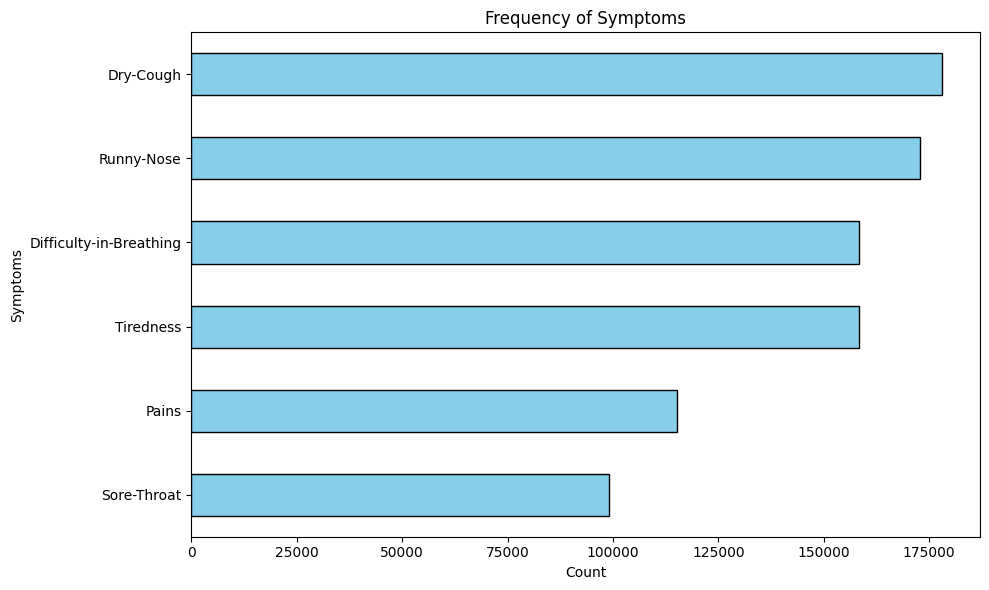

In [16]:
fig, ax = plt.subplots(figsize=(10, 6))

symptom_counts.sort_values().plot(kind='barh', ax=ax, color='skyblue', edgecolor='black')
ax.set_title('Frequency of Symptoms')
ax.set_xlabel('Count')
ax.set_ylabel('Symptoms')

plt.tight_layout()
plt.show()

Visualizing the distribution of individuals across different age groups

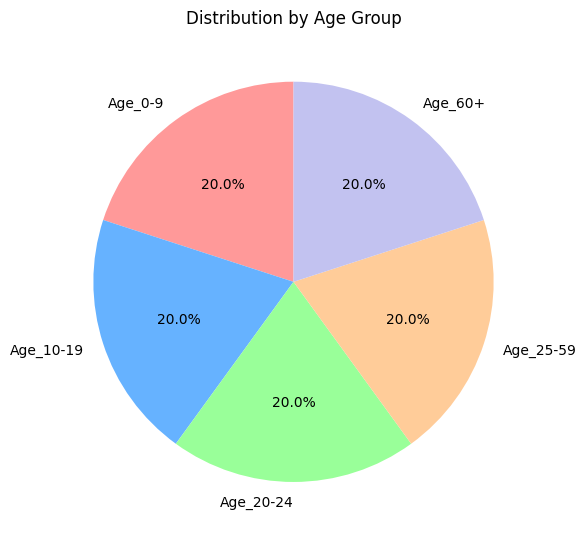

In [17]:
#Age
fig, ax = plt.subplots(figsize=(6, 6))
age_distribution.plot(kind='pie', ax=ax, autopct='%1.1f%%', startangle=90, colors=['#ff9999','#66b2ff','#99ff99','#ffcc99', '#c2c2f0'])
ax.set_title('Distribution by Age Group')
ax.set_ylabel('')

plt.tight_layout()
plt.show()

Visualizing the distribution of individuals by gender

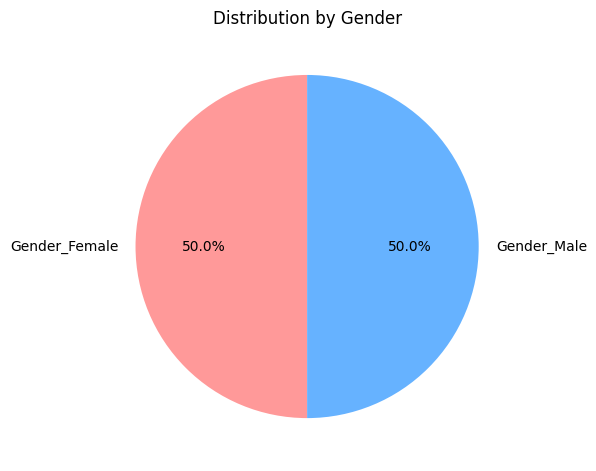

In [18]:
# gender
fig, ax = plt.subplots(figsize=(6, 6))
gender_distribution.plot(kind='pie', ax=ax, autopct='%1.1f%%', startangle=90, colors=['#ff9999', '#66b2ff'])
ax.set_title('Distribution by Gender')
ax.set_ylabel('')

plt.tight_layout()
plt.show()

It is better to have 1 column as Gender so we are checking whether Gender_Male and Gender_Female has 1 or 0 at the same time

In [19]:
data_with_both_genders = data1[((data1['Gender_Male'] == 1) & (data1['Gender_Female'] == 1)) | ((data1['Gender_Male'] == 0) & (data1['Gender_Female'] == 0)) ]
print(data_with_both_genders)

        Tiredness  Dry-Cough  Difficulty-in-Breathing  Sore-Throat  \
4224            1          1                        1            1   
4225            1          1                        1            1   
4226            1          1                        1            1   
4227            1          1                        1            1   
4228            1          1                        1            1   
...           ...        ...                      ...          ...   
316795          0          0                        0            0   
316796          0          0                        0            0   
316797          0          0                        0            0   
316798          0          0                        0            0   
316799          0          0                        0            0   

        None_Sympton  Pains  Runny-Nose  None_Experiencing  Age_0-9  \
4224               0      1           1                  0        1   
4225             

In [20]:
# Find rows where both Gender_Male and Gender_Female have values of either 0 or 1
rows_to_drop = data1[((data1['Gender_Male'] == 1) & (data1['Gender_Female'] == 1)) | ((data1['Gender_Male'] == 0) & (data1['Gender_Female'] == 0))].index

# Drop the rows
data1 = data1.drop(rows_to_drop)

# Print the resulting DataFrame
print(data1)


        Tiredness  Dry-Cough  Difficulty-in-Breathing  Sore-Throat  \
0               1          1                        1            1   
1               1          1                        1            1   
2               1          1                        1            1   
3               1          1                        1            1   
4               1          1                        1            1   
...           ...        ...                      ...          ...   
314683          0          0                        0            0   
314684          0          0                        0            0   
314685          0          0                        0            0   
314686          0          0                        0            0   
314687          0          0                        0            0   

        None_Sympton  Pains  Runny-Nose  None_Experiencing  Age_0-9  \
0                  0      1           1                  0        1   
1                

Now we are droping Gender_Female as we can identify the Gender only by using Gender_Male( Since it has both the values 0's and 1's)

In [21]:
data1 = data1.drop('Gender_Female', axis=1)
print(data1)


        Tiredness  Dry-Cough  Difficulty-in-Breathing  Sore-Throat  \
0               1          1                        1            1   
1               1          1                        1            1   
2               1          1                        1            1   
3               1          1                        1            1   
4               1          1                        1            1   
...           ...        ...                      ...          ...   
314683          0          0                        0            0   
314684          0          0                        0            0   
314685          0          0                        0            0   
314686          0          0                        0            0   
314687          0          0                        0            0   

        None_Sympton  Pains  Runny-Nose  None_Experiencing  Age_0-9  \
0                  0      1           1                  0        1   
1                

 Visualizing the distribution of severity levels

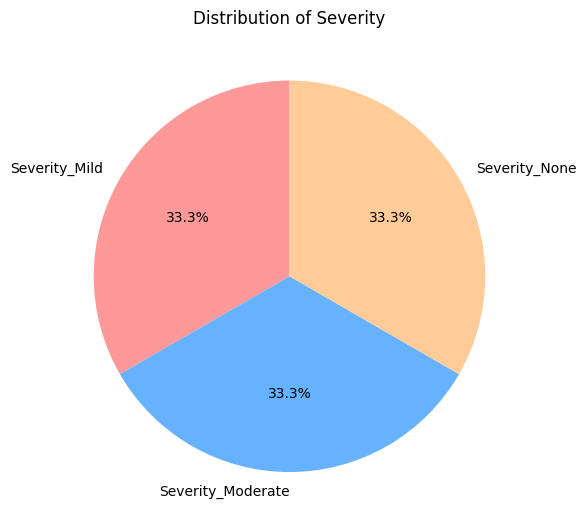

In [22]:
# severity
fig, ax = plt.subplots(figsize=(6, 6))
severity_distribution.plot(kind='pie', ax=ax, autopct='%1.1f%%', startangle=90, colors=['#ff9999','#66b2ff','#ffcc99'])
ax.set_title('Distribution of Severity')
ax.set_ylabel('')

plt.tight_layout()
plt.show()

Code computes the mean presence of symptoms for each severity level

In [23]:
# Mean presence
severity_symptom_means = data1.groupby(by=[col for col in data1.columns if "Severity_" in col])[symptoms].mean()

severity_symptom_means = severity_symptom_means.transpose()
severity_symptom_means

Severity_Mild                   0                             1
Severity_Moderate               0                   1         0
Severity_None                   0         1         0         0
Tiredness                0.500019  0.500000  0.500000  0.499981
Dry-Cough                0.562486  0.562500  0.562500  0.562467
Difficulty-in-Breathing  0.500019  0.500000  0.500000  0.500019
Sore-Throat              0.312505  0.312500  0.312500  0.312505
Pains                    0.363607  0.363636  0.363636  0.363645
Runny-Nose               0.545420  0.545455  0.545455  0.545477

 Mean presence of a symptom across different severity levels

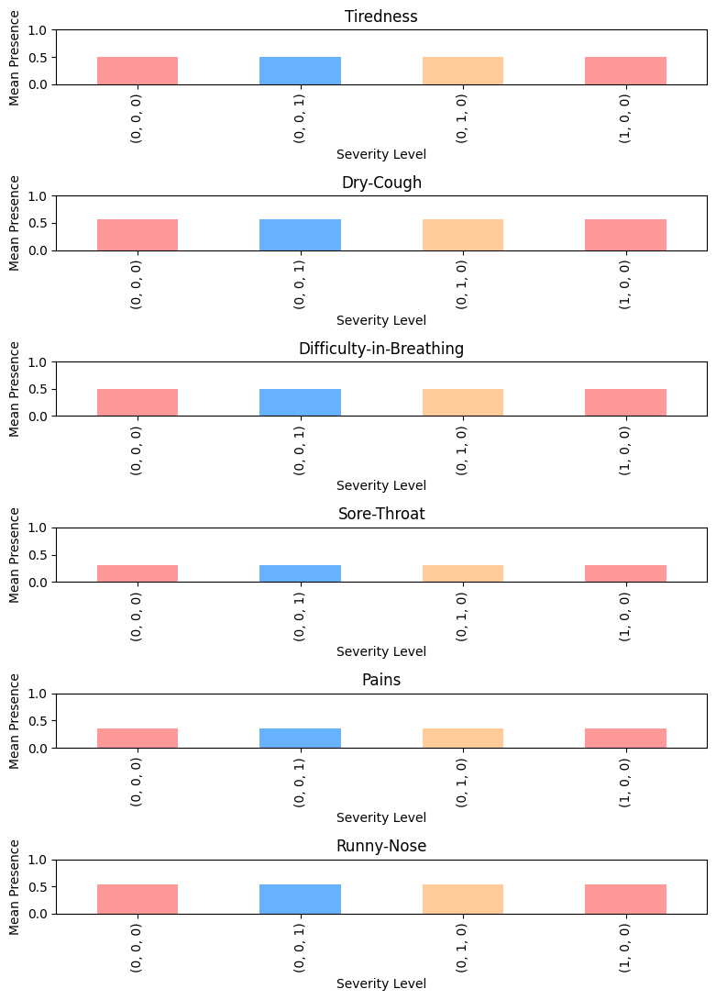

In [24]:
fig, axes = plt.subplots(nrows=len(symptoms), ncols=1, figsize=(8, 11))

for i, symptom in enumerate(symptoms):
    severity_symptom_means.loc[symptom].plot(kind='bar', ax=axes[i], color=['#ff9999', '#66b2ff', '#ffcc99'])
    axes[i].set_title(symptom)
    axes[i].set_ylabel('Mean Presence')
    axes[i].set_xlabel('Severity Level')
    axes[i].set_ylim(0, 1)

plt.tight_layout()
plt.show()

Correlation Matrix between Symptoms

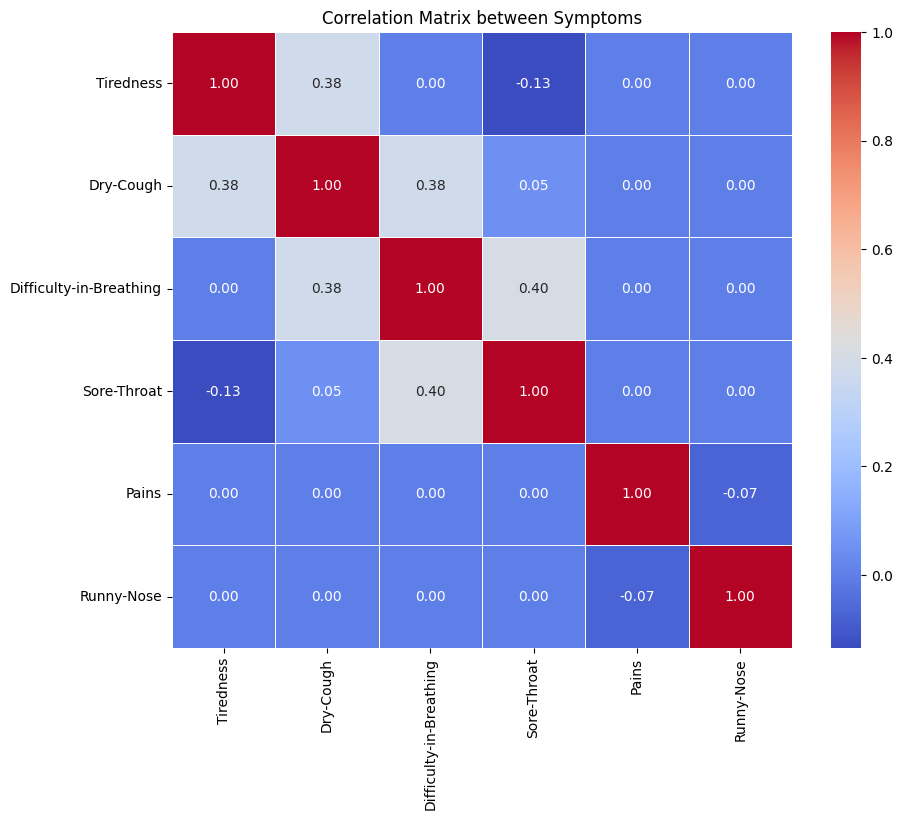

In [25]:
# Calculate the correlation matrix
correlation_matrix = data1[symptoms].corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix between Symptoms')
plt.show()




Visualizes the distribution of each numerical column in Dataset 1

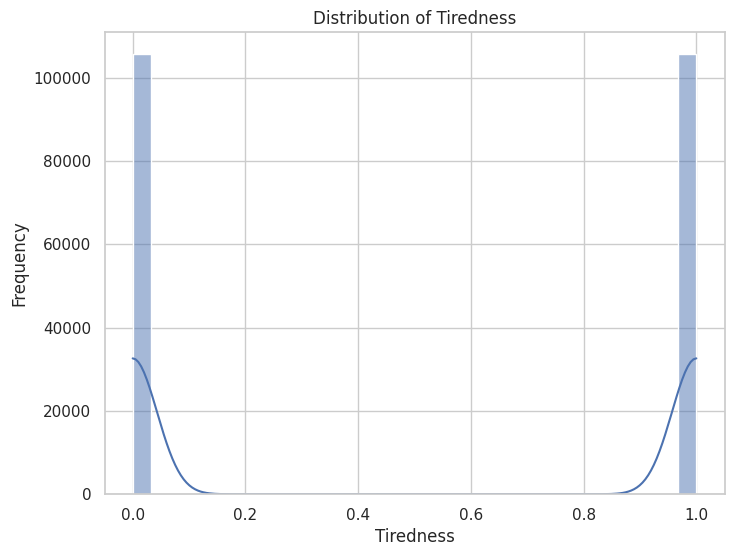

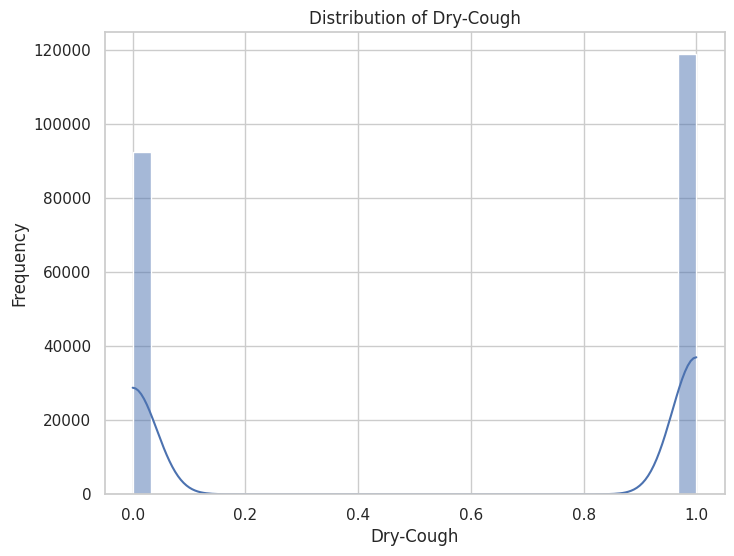

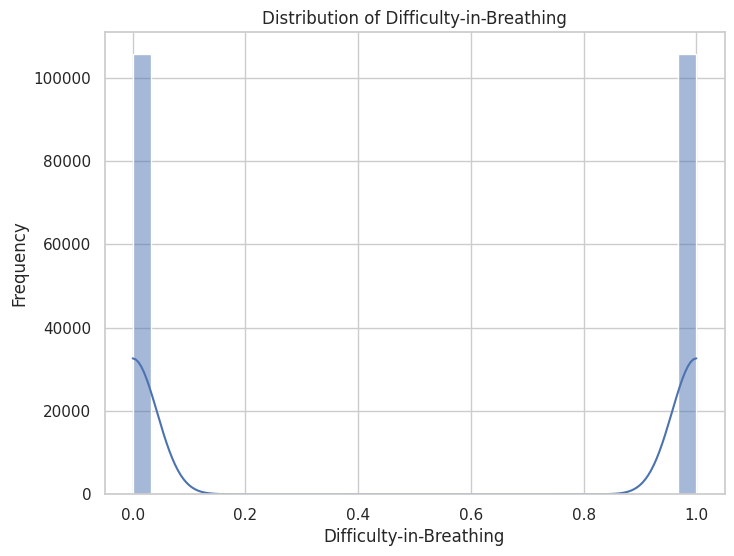

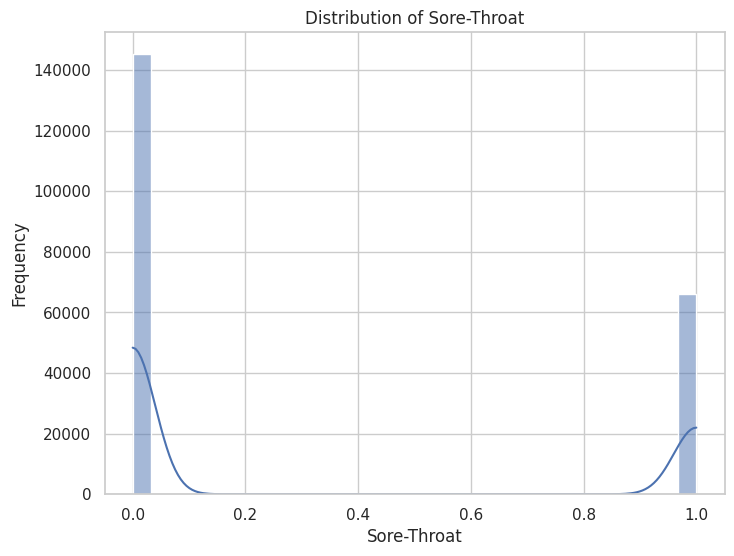

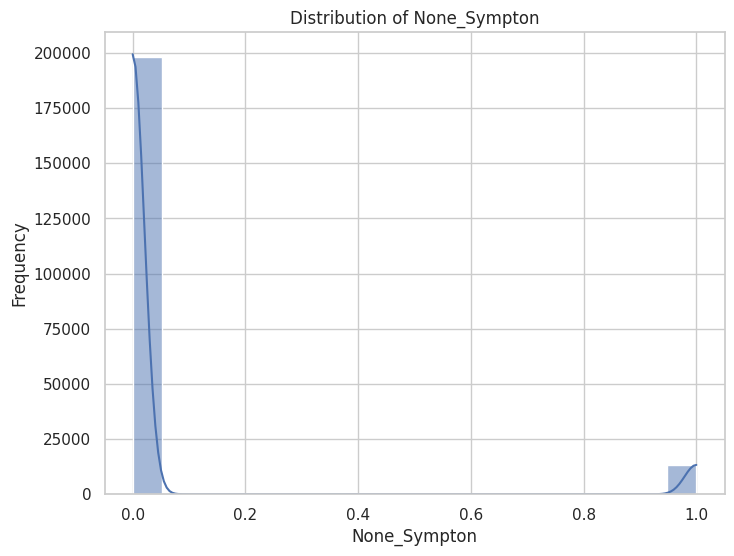

...

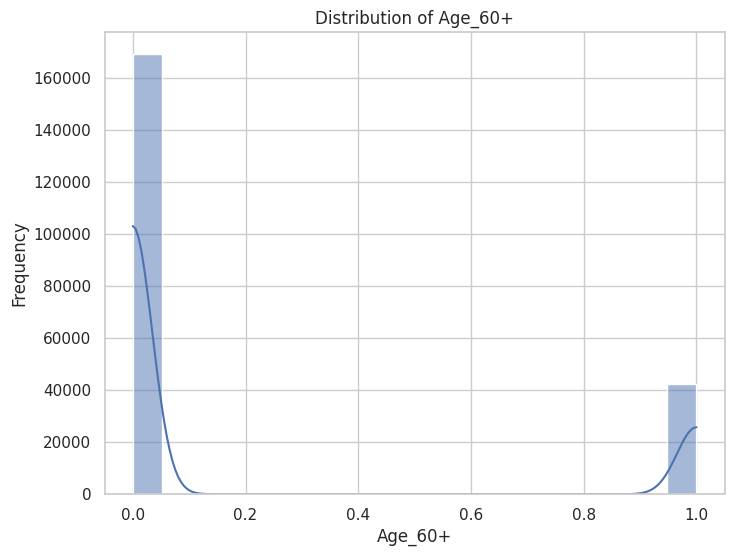

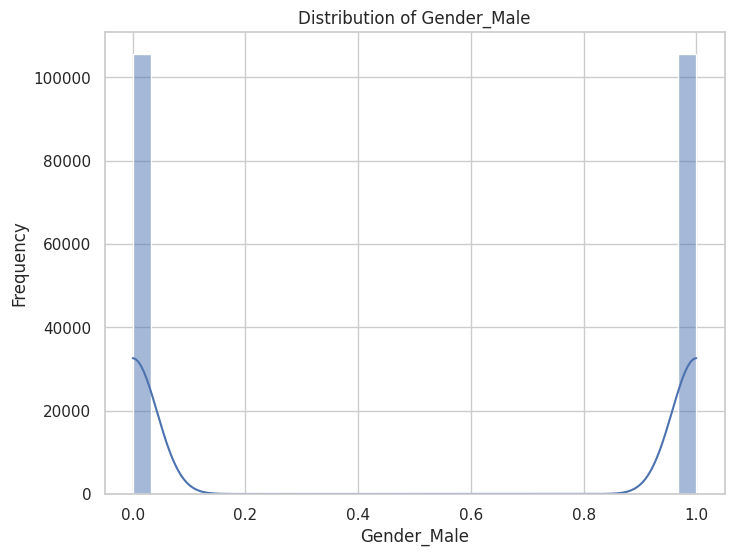

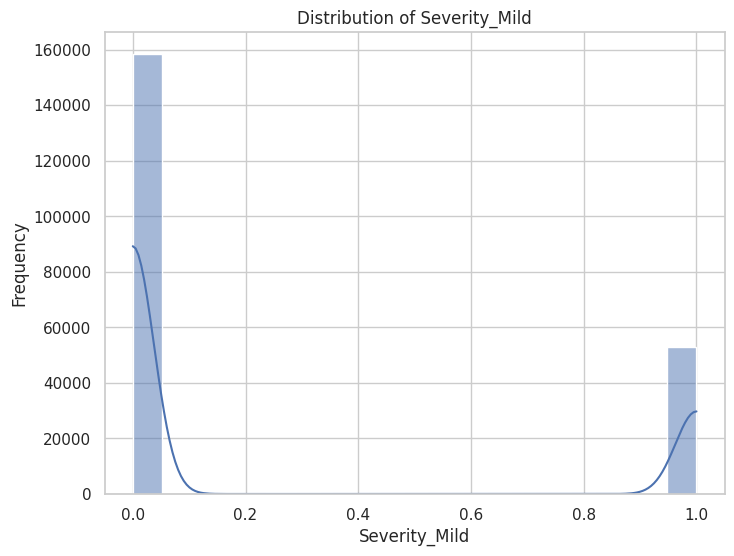

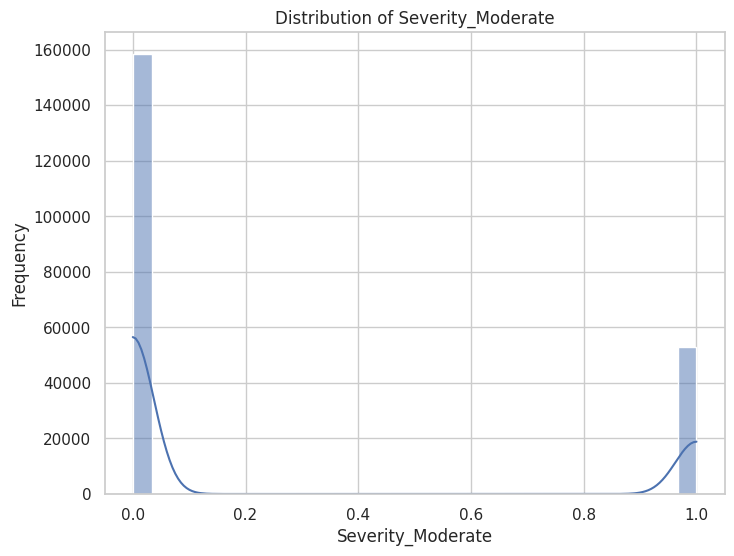

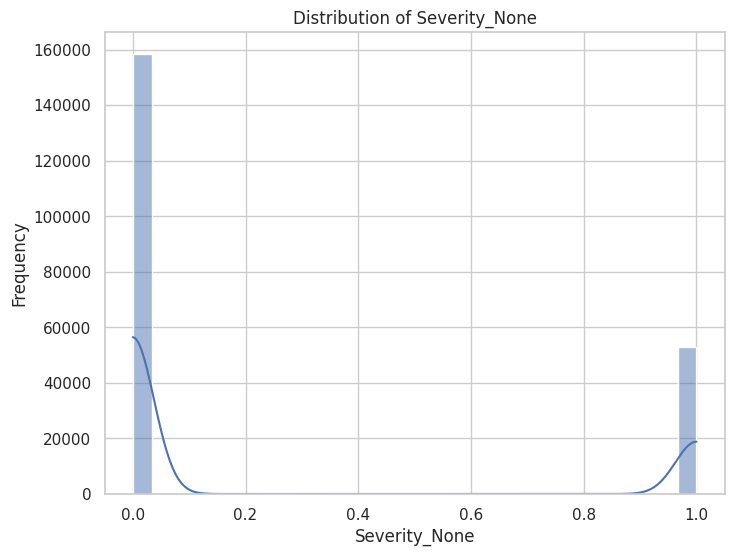

In [26]:
# Visualize the distribution of each numerical column
sns.set(style="whitegrid")

# Plot histograms of numerical columns
numerical_cols = data1.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(data1[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

Visualizing the distribution of each numerical column in the Dataset 1

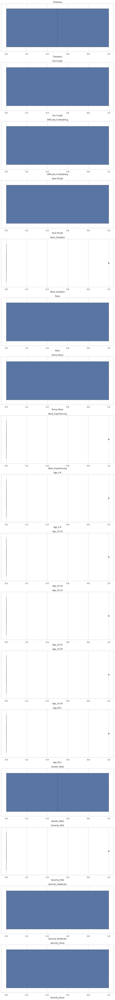

In [27]:
# Select numerical columns
numerical_columns = data1.select_dtypes(include=['float64', 'int64']).columns

# Create subplots for each numerical column
fig, axes = plt.subplots(nrows=len(numerical_columns), figsize=(10, 5*len(numerical_columns)))

# Plot box plots for each numerical column
for i, column in enumerate(numerical_columns):
    sns.boxplot(x=data1[column], ax=axes[i])
    axes[i].set_title(column)

plt.tight_layout()
plt.show()

# Dataset2

Reading Dataset2

In [28]:
data2 = pd.read_csv("asthma_dataset.csv")
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Patient_ID        300 non-null    int64 
 1   Age               300 non-null    int64 
 2   Gender            300 non-null    object
 3   Smoking_Status    300 non-null    object
 4   Asthma_Diagnosis  295 non-null    object
 5   Medication        157 non-null    object
 6   Peak_Flow         300 non-null    int64 
dtypes: int64(3), object(4)
memory usage: 16.5+ KB


In [29]:
# Iterate through each column and display unique values
for column in data2.columns:
    unique_values = data2[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Patient_ID
[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234
 235 236 237 238 239 240 241 242

In [30]:
# Iterate through each column and display value counts
for column in data2.columns:
    print(f"Column: {column}")
    print(data2[column].value_counts())
    print()

Column: Patient_ID
Patient_ID
1      1
207    1
205    1
204    1
203    1
      ..
100    1
99     1
98     1
97     1
300    1
Name: count, Length: 300, dtype: int64

Column: Age
Age
27     13
29     12
59     10
23     10
45     10
43      9
20      9
21      9
34      9
52      9
65      8
58      8
41      8
22      8
30      8
24      7
38      7
63      7
49      7
54      7
64      6
47      6
48      6
28      6
46      6
26      6
51      6
18      6
25      6
19      5
44      5
32      5
36      5
33      5
42      5
50      4
39      4
37      4
31      3
62      3
60      3
53      3
56      3
35      2
61      2
55      2
40      2
448     1
57      1
564     1
339     1
222     1
327     1
Name: count, dtype: int64

Column: Gender
Gender
Female    159
Male      141
Name: count, dtype: int64

Column: Smoking_Status
Smoking_Status
Non-Smoker        109
Current Smoker    100
Ex-Smoker          91
Name: count, dtype: int64

Column: Asthma_Diagnosis
Asthma_Diagnosis
Yes    1

Dropping rows from the dataset2 where 'Age' column contains values less than 0 or greater than 100

In [31]:
# Drop rows with negative values and values greater than 100 in the 'age' column
data2 = data2[(data2['Age'] >= 0) & (data2['Age'] <= 100)]

# Check the updated value counts in the 'age' column
print(data2['Age'].value_counts())

Age
27    13
29    12
23    10
45    10
59    10
21     9
52     9
43     9
20     9
34     9
58     8
30     8
22     8
41     8
65     8
63     7
38     7
24     7
49     7
54     7
47     6
64     6
26     6
18     6
25     6
48     6
46     6
51     6
28     6
32     5
44     5
19     5
42     5
36     5
33     5
50     4
37     4
39     4
62     3
53     3
60     3
56     3
31     3
55     2
61     2
35     2
40     2
57     1
Name: count, dtype: int64


Dropping the column named 'Patient_ID' from dataset2 as we will not need it

In [32]:
data2.drop(columns=['Patient_ID'], inplace=True)
print(data2)

     Age  Gender  Smoking_Status Asthma_Diagnosis             Medication  \
0     26  Female      Non-Smoker              Yes                Inhaler   
1     52  Female       Ex-Smoker               No                    NaN   
2     56  Female       Ex-Smoker              Yes                Inhaler   
3     55    Male  Current Smoker              Yes  Controller Medication   
4     43  Female  Current Smoker               No                    NaN   
..   ...     ...             ...              ...                    ...   
295   25  Female  Current Smoker               No                    NaN   
296   20    Male       Ex-Smoker               No                    NaN   
297   25  Female      Non-Smoker               No                    NaN   
298   18    Male       Ex-Smoker               No                    NaN   
299   59  Female  Current Smoker               No                    NaN   

     Peak_Flow  
0          175  
1          156  
2          236  
3          378  
4 

<ipython-input-32-6fe4c673cdc0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2.drop(columns=['Patient_ID'], inplace=True)


Imputing Missing values in 'Asthma Diagonis' with most frequent values instead of dropping the NAN values

In [33]:
mode_value = data2['Asthma_Diagnosis'].mode()[0]
data2['Asthma_Diagnosis'].fillna(mode_value, inplace=True)
print(data2)

     Age  Gender  Smoking_Status Asthma_Diagnosis             Medication  \
0     26  Female      Non-Smoker              Yes                Inhaler   
1     52  Female       Ex-Smoker               No                    NaN   
2     56  Female       Ex-Smoker              Yes                Inhaler   
3     55    Male  Current Smoker              Yes  Controller Medication   
4     43  Female  Current Smoker               No                    NaN   
..   ...     ...             ...              ...                    ...   
295   25  Female  Current Smoker               No                    NaN   
296   20    Male       Ex-Smoker               No                    NaN   
297   25  Female      Non-Smoker               No                    NaN   
298   18    Male       Ex-Smoker               No                    NaN   
299   59  Female  Current Smoker               No                    NaN   

     Peak_Flow  
0          175  
1          156  
2          236  
3          378  
4 

<ipython-input-33-46b4d6701543>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['Asthma_Diagnosis'].fillna(mode_value, inplace=True)


Checking for Null values in each row of the dataset2

In [34]:
data2[data2.isnull().any(axis = 1)]

,Age,Gender,Smoking_Status,Asthma_Diagnosis,Medication,Peak_Flow
1,52,Female,Ex-Smoker,No,NaN,156
4,43,Female,Current Smoker,No,NaN,159
5,23,Male,Non-Smoker,No,NaN,376
6,33,Female,Current Smoker,No,NaN,296
8,36,Male,Current Smoker,No,NaN,175
...,...,...,...,...,...,...
295,25,Female,Current Smoker,No,NaN,283
296,20,Male,Ex-Smoker,No,NaN,202
297,25,Female,Non-Smoker,No,NaN,208
298,18,Male,Ex-Smoker,No,NaN,175


The NAN values in 'Medication' Column are not null , it is No Medication so we are replacing it

In [35]:
data2['Medication'] = data2['Medication'].fillna('No Medication')
print(data2)


     Age  Gender  Smoking_Status Asthma_Diagnosis             Medication  \
0     26  Female      Non-Smoker              Yes                Inhaler   
1     52  Female       Ex-Smoker               No          No Medication   
2     56  Female       Ex-Smoker              Yes                Inhaler   
3     55    Male  Current Smoker              Yes  Controller Medication   
4     43  Female  Current Smoker               No          No Medication   
..   ...     ...             ...              ...                    ...   
295   25  Female  Current Smoker               No          No Medication   
296   20    Male       Ex-Smoker               No          No Medication   
297   25  Female      Non-Smoker               No          No Medication   
298   18    Male       Ex-Smoker               No          No Medication   
299   59  Female  Current Smoker               No          No Medication   

     Peak_Flow  
0          175  
1          156  
2          236  
3          378  
4 

<ipython-input-35-ac24dd1fd6fb>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['Medication'] = data2['Medication'].fillna('No Medication')


Identifying numerical features and categorical features in the dataset2

In [36]:
numerical_features = data2.select_dtypes(include = ['int', 'float']).columns.to_list()
categorical_features = data2.select_dtypes(include = ['object', 'category']).columns.to_list()

The distribution of numerical variables through KDE and histogram plots

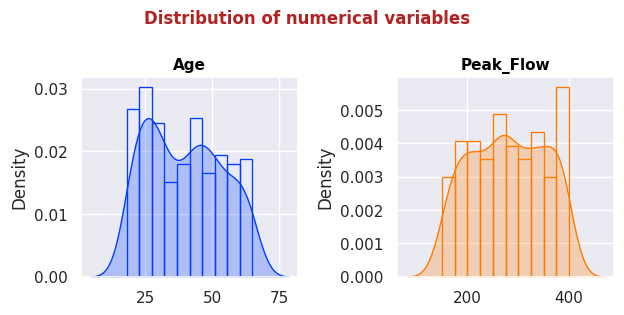

In [37]:
sns.set_style('darkgrid')
colors = sns.color_palette(palette = 'bright',
                           n_colors = len(numerical_features))

fig,ax = plt.subplots(nrows = 1, ncols = 2, figsize = (6.5, 3.2))
ax = ax.flat

for i,feature in enumerate(numerical_features):
    sns.kdeplot(data2, x = feature, fill = True, color = colors[i], ax = ax[i])
    sns.histplot(data2, x = feature, stat = 'density', fill = False, color = colors[i], ax = ax[i])
    ax[i].set_xlabel('')
    ax[i].set_title(feature, fontsize = 11, fontweight = 'bold', color = 'black')

fig.suptitle("Distribution of numerical variables", fontsize = 12, fontweight = 'bold', color = 'firebrick')
fig.tight_layout()
fig.show()

Q-Q plot for a numerical feature

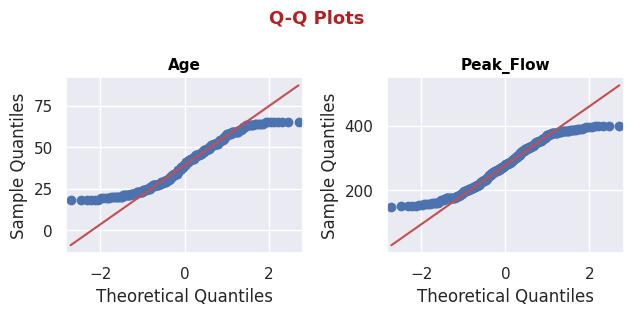

In [38]:
fig,ax = plt.subplots(nrows = 1, ncols = 2, figsize = (6.5, 3.2))
ax = ax.flat

for i,feature in enumerate(numerical_features):
    sm.qqplot(data2[feature], line = 'q', ax = ax[i], lw = 2.1)
    ax[i].set_title(feature, fontsize = 11, fontweight = 'bold', color = 'black')

fig.suptitle("Q-Q Plots", fontsize = 13, fontweight = 'bold', color = 'firebrick')
fig.tight_layout()
fig.show()

Chart representing the Gender comparission

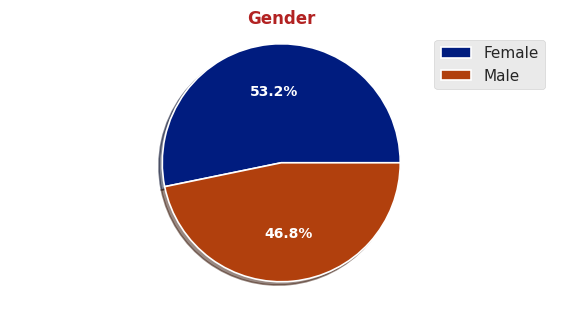

In [39]:
plt.style.use('ggplot')
plt.figure(figsize = (7,3.4))
plt.pie(x = list(Counter(data2[categorical_features[0]]).values()),
        labels = list(Counter(data2[categorical_features[0]]).keys()),
        colors = [color for color in sns.color_palette(palette = 'dark', n_colors = data2[categorical_features[0]].nunique())],
        autopct = "%.1f%%",
        shadow = True,
        textprops = {'fontsize':10, 'fontweight':'bold', 'color':'white'},
        wedgeprops = {'edgecolor':'white', 'linewidth':1.2})
plt.title(categorical_features[0], fontsize = 12, fontweight = 'bold', color = 'firebrick')
plt.legend()
plt.axis('equal')
plt.show()

Chart representing the Smoking Status comparission

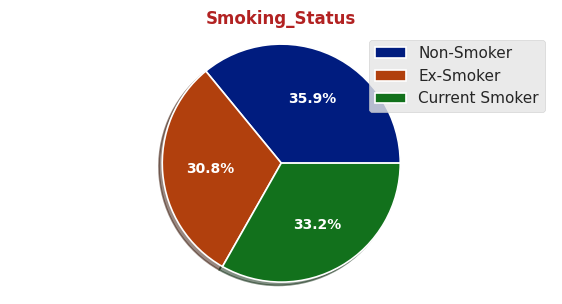

In [40]:
plt.style.use('ggplot')
plt.figure(figsize = (7,3.4))
plt.pie(x = list(Counter(data2[categorical_features[1]]).values()),
        labels = list(Counter(data2[categorical_features[1]]).keys()),
        colors = [color for color in sns.color_palette(palette = 'dark', n_colors = data2[categorical_features[1]].nunique())],
        autopct = "%.1f%%",
        shadow = True,
        textprops = {'fontsize':10, 'fontweight':'bold', 'color':'white'},
        wedgeprops = {'edgecolor':'white', 'linewidth':1.2})
plt.title(categorical_features[1], fontsize = 12, fontweight = 'bold', color = 'firebrick')
plt.legend()
plt.axis('equal')
plt.show()

Chart representing the Asthma Diagonsis comparission

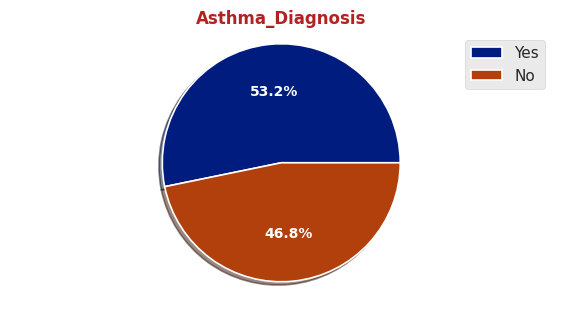

In [41]:
plt.style.use('ggplot')
plt.figure(figsize = (7,3.4))
plt.pie(x = list(Counter(data2[categorical_features[2]]).values()),
        labels = list(Counter(data2[categorical_features[2]]).keys()),
        colors = [color for color in sns.color_palette(palette = 'dark', n_colors = data2[categorical_features[2]].nunique())],
        autopct = "%.1f%%",
        shadow = True,
        textprops = {'fontsize':10, 'fontweight':'bold', 'color':'white'},
        wedgeprops = {'edgecolor':'white', 'linewidth':1.2})
plt.title(categorical_features[2], fontsize = 12, fontweight = 'bold', color = 'firebrick')
plt.legend()
plt.axis('equal')
plt.show()

Joint plot between "Age" and "Peak_Flow

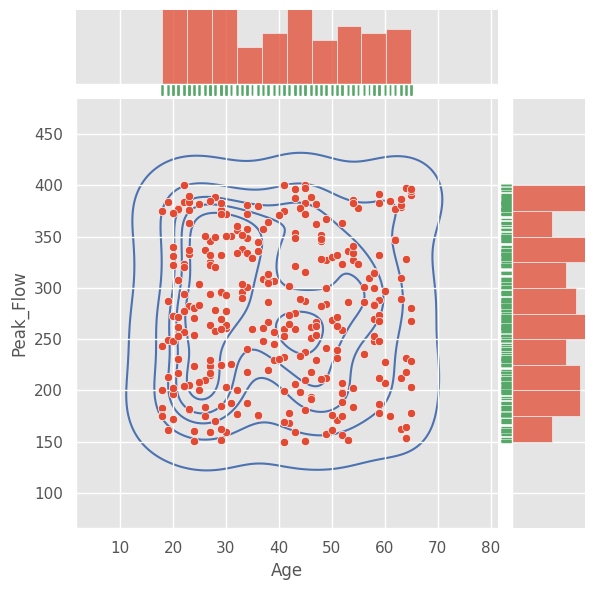

In [42]:
g = sns.jointplot(data=data2, x="Age", y="Peak_Flow")
g.plot_joint(sns.kdeplot, color="b", zorder=0, levels=6)
g.plot_marginals(sns.rugplot, color="g", height=-.15, clip_on=False)
g.fig.show()

Gender Based Comparission of Asthma Dignosis

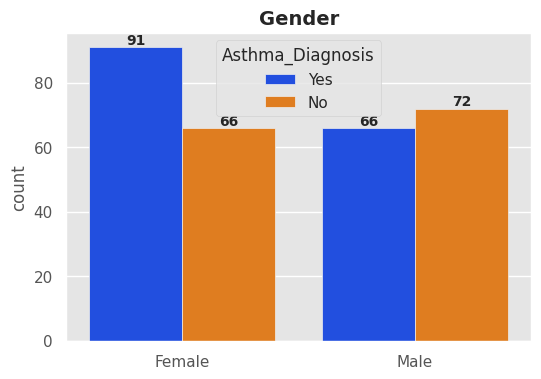

In [43]:
fig,ax = plt.subplots(figsize = (6,4))
ax = sns.countplot(data2, x = categorical_features[0],
                   hue = categorical_features[2], palette = 'bright')

for bars in ax.containers:
    ax.bar_label(bars, fontsize = 10, fontweight = 'bold')

ax.set_xlabel('')
ax.set_title(categorical_features[0], fontsize = 14, fontweight = 'bold')
fig.show()

Smoking Status Based Comparission of Asthma Dignosis

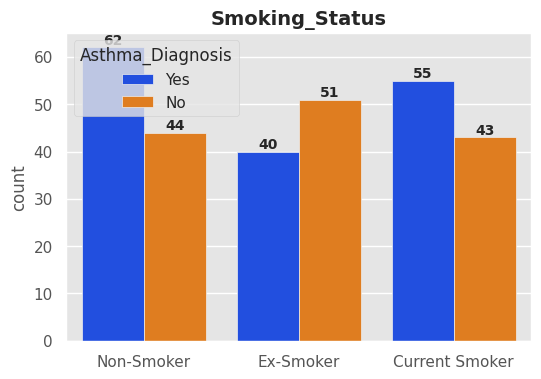

In [44]:
fig,ax = plt.subplots(figsize = (6,4))
ax = sns.countplot(data2, x = categorical_features[1],
                   hue = categorical_features[2], palette = 'bright')

for bars in ax.containers:
    ax.bar_label(bars, fontsize = 10, fontweight = 'bold')

ax.set_xlabel('')
ax.set_title(categorical_features[1], fontsize = 14, fontweight = 'bold')
fig.show()

Comprehensive analysis of numerical features in the context of asthma diagnosis prediction


In [45]:
def BiPlot(idx:int):
    plt.figure(figsize = (7,3.2))
    sns.kdeplot(data2, x = numerical_features[idx], palette = 'bright', fill = True, hue = 'Asthma_Diagnosis')
    plt.xlabel("")
    plt.title(numerical_features[idx], fontweight = 'bold', color = 'black')
    plt.show()

def DescribePlot(idx:int):
    return data2.groupby('Asthma_Diagnosis')[numerical_features[idx]].describe().style.bar(color = 'gold', subset = ['mean', '50%'])

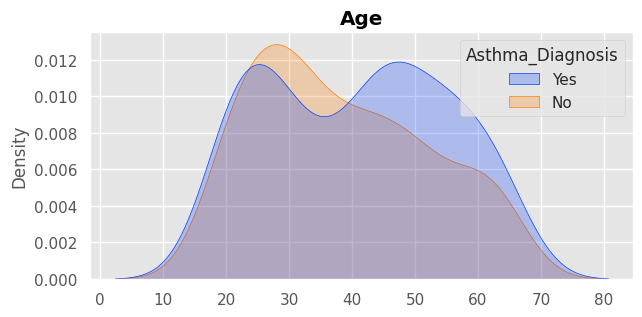

In [46]:
BiPlot(0)

Descriptive statistics for the numerical feature

In [47]:
DescribePlot(0)

,count,mean,std,min,25%,50%,75%,max
Asthma_Diagnosis,,,,,,,,
No,138.000000,38.420290,13.647176,18.000000,27.000000,36.000000,49.000000,65.000000
Yes,157.000000,40.751592,14.334670,18.000000,27.000000,43.000000,52.000000,65.000000


Relationship between two numerical variables, 'Age' and 'Peak_Flow

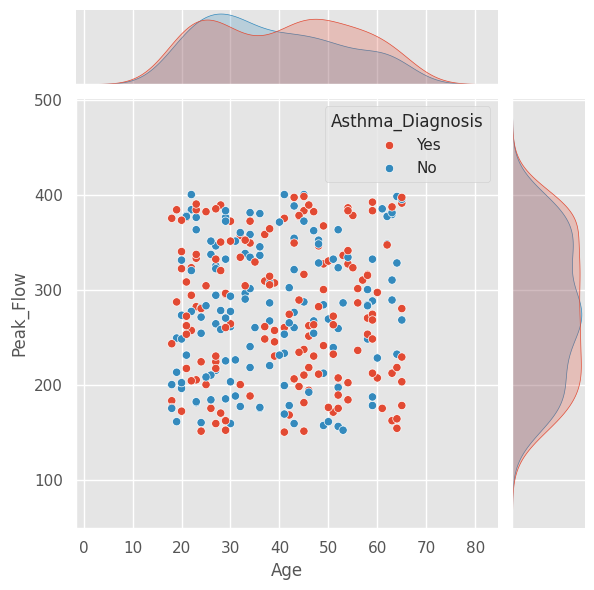

In [48]:
g = sns.jointplot(data = data2,
              x = "Age",
              y = "Peak_Flow",
              hue = "Asthma_Diagnosis")
g.fig.show()

In [49]:
data2 = pd.get_dummies(data=data2, drop_first=True)
data2.head()

,Age,Peak_Flow,Gender_Male,Smoking_Status_Ex-Smoker,Smoking_Status_Non-Smoker,Asthma_Diagnosis_Yes,Medication_Inhaler,Medication_No Medication
0,26,175,False,False,True,True,True,False
1,52,156,False,True,False,False,False,True
2,56,236,False,True,False,True,True,False
3,55,378,True,False,False,True,False,False
4,43,159,False,False,False,False,False,True


In [50]:
change_col =  ['Gender_Male','Smoking_Status_Ex-Smoker','Smoking_Status_Non-Smoker','Asthma_Diagnosis_Yes','Medication_Inhaler','Medication_No Medication']
for col in change_col:
    data2[col] = data2[col].replace(False, 0)
    data2[col] = data2[col].replace(True, 1)
data2.head()

,Age,Peak_Flow,Gender_Male,Smoking_Status_Ex-Smoker,Smoking_Status_Non-Smoker,Asthma_Diagnosis_Yes,Medication_Inhaler,Medication_No Medication
0,26,175,0,0,1,1,1,0
1,52,156,0,1,0,0,0,1
2,56,236,0,1,0,1,1,0
3,55,378,1,0,0,1,0,0
4,43,159,0,0,0,0,0,1


In [51]:
# Iterate through each column and display value counts
for column in data2.columns:
    print(f"Column: {column}")
    print(data2[column].value_counts())
    print()

Column: Age
Age
27    13
29    12
23    10
45    10
59    10
21     9
52     9
43     9
20     9
34     9
58     8
30     8
22     8
41     8
65     8
63     7
38     7
24     7
49     7
54     7
47     6
64     6
26     6
18     6
25     6
48     6
46     6
51     6
28     6
32     5
44     5
19     5
42     5
36     5
33     5
50     4
37     4
39     4
62     3
53     3
60     3
56     3
31     3
55     2
61     2
35     2
40     2
57     1
Name: count, dtype: int64

Column: Peak_Flow
Peak_Flow
175    5
383    4
260    4
372    4
248    4
      ..
156    1
197    1
308    1
338    1
208    1
Name: count, Length: 178, dtype: int64

Column: Gender_Male
Gender_Male
0    157
1    138
Name: count, dtype: int64

Column: Smoking_Status_Ex-Smoker
Smoking_Status_Ex-Smoker
0    204
1     91
Name: count, dtype: int64

Column: Smoking_Status_Non-Smoker
Smoking_Status_Non-Smoker
0    189
1    106
Name: count, dtype: int64

Column: Asthma_Diagnosis_Yes
Asthma_Diagnosis_Yes
1    157
0    138
Name:

Correlation Matrix

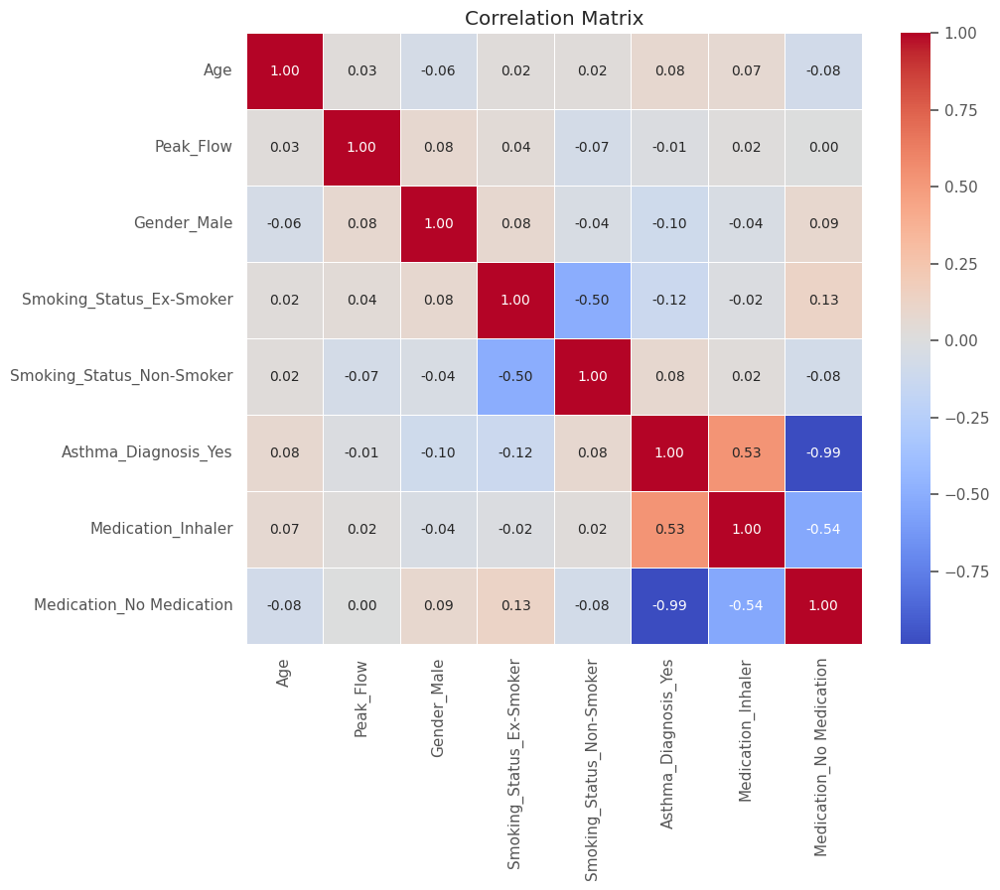

In [52]:
# Select only numeric columns
numeric_data = data2.select_dtypes(include='number')

# Calculate the correlation matrix
correlation_matrix = numeric_data.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

Distribution of each numerical column

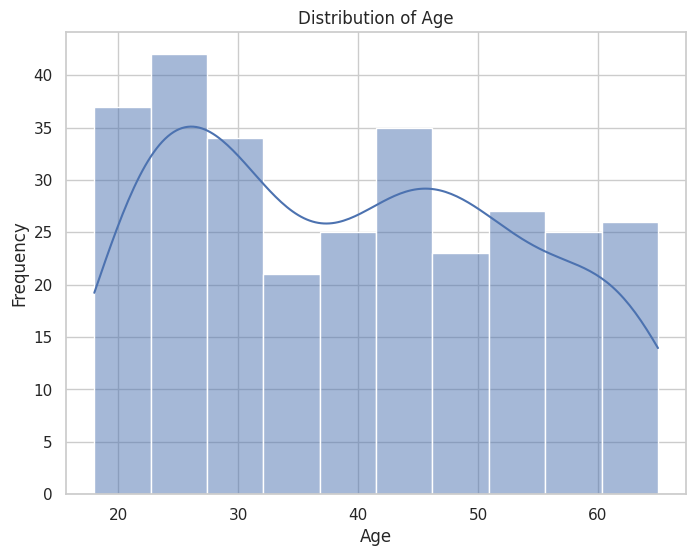

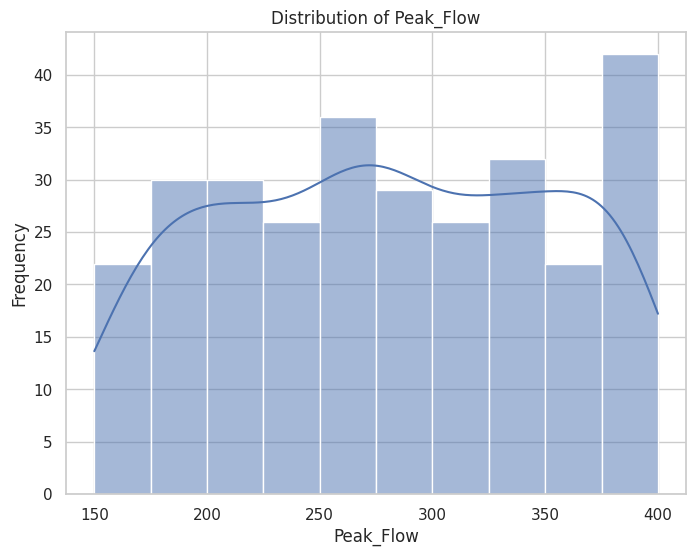

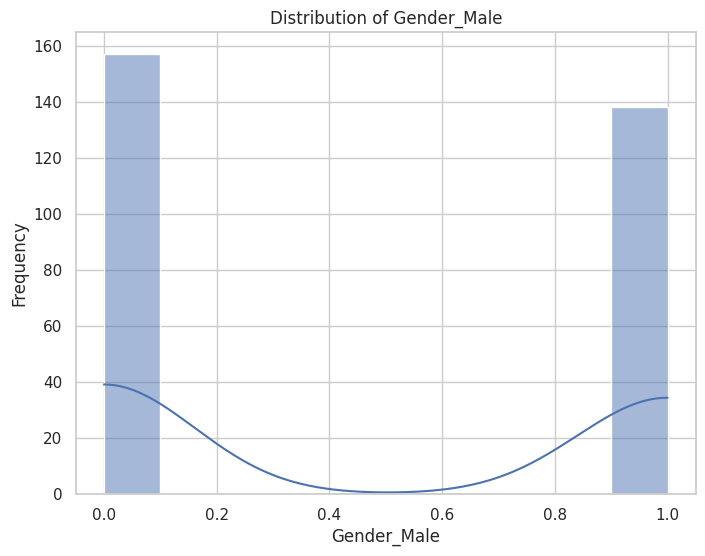

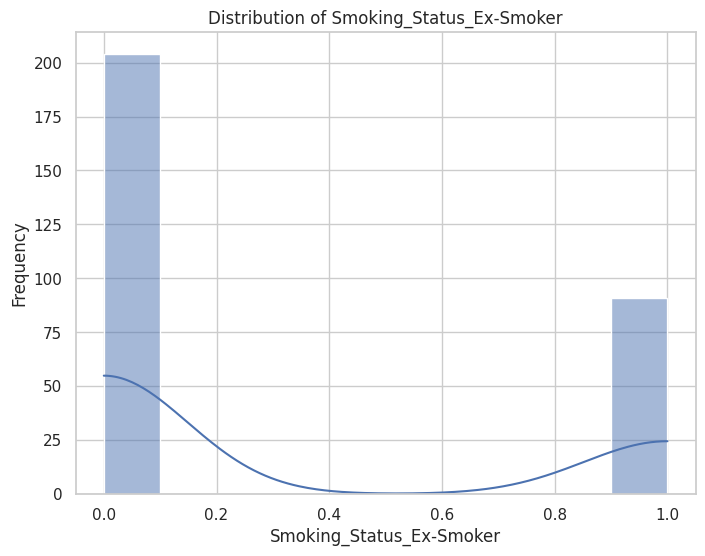

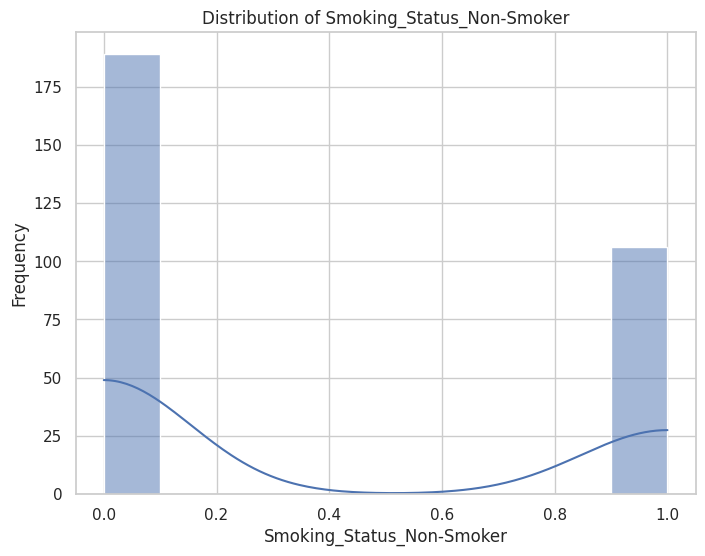

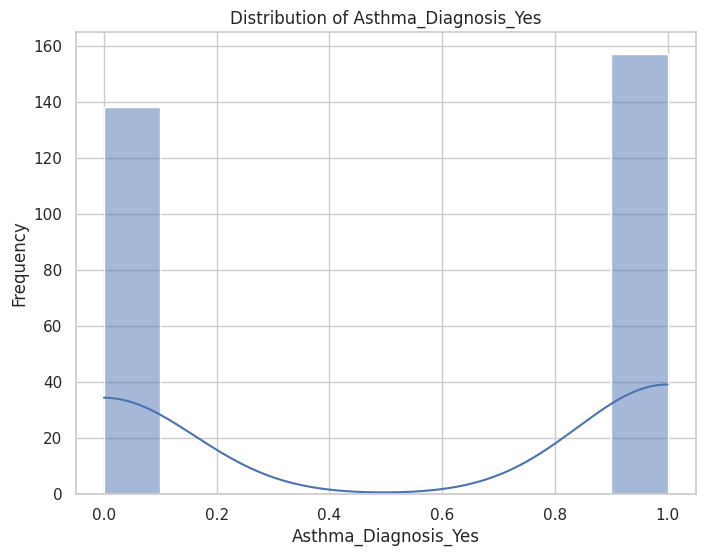

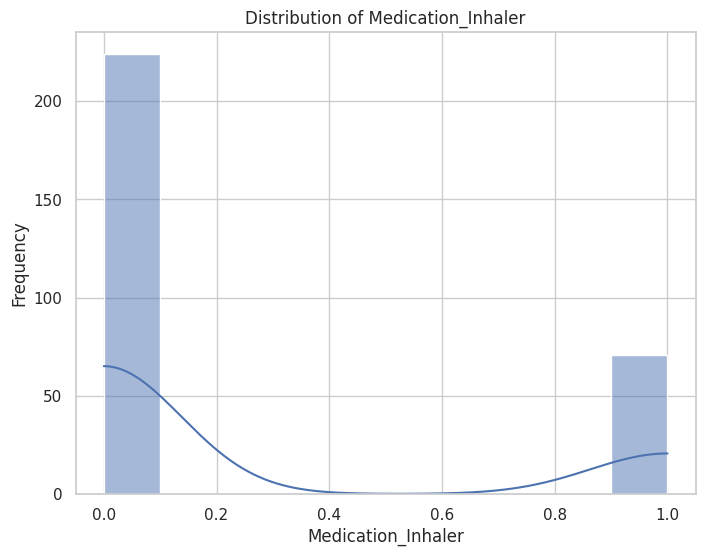

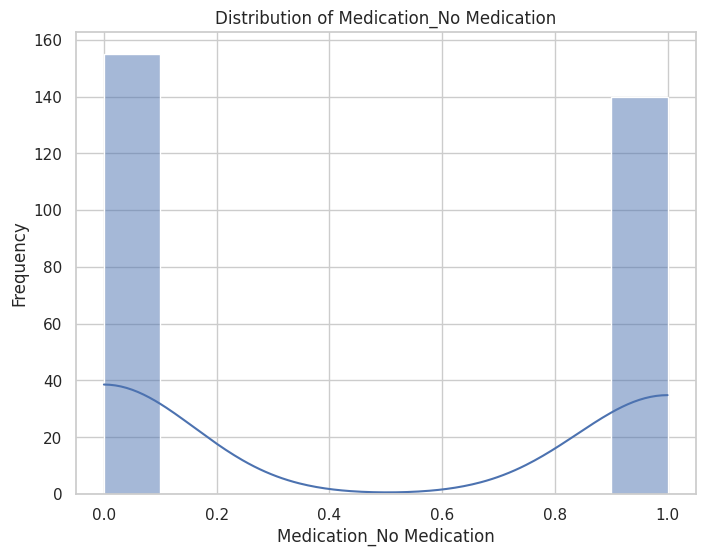

In [53]:
# Visualize the distribution of each numerical column
sns.set(style="whitegrid")

# Plot histograms of numerical columns
numerical_cols = data2.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(data2[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

Plotting Numerical columns

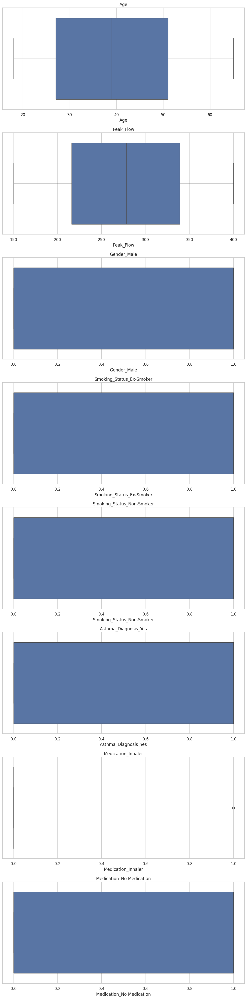

In [54]:
# Select numerical columns
numerical_columns = data2.select_dtypes(include=['float64', 'int64']).columns

# Create subplots for each numerical column
fig, axes = plt.subplots(nrows=len(numerical_columns), figsize=(10, 5*len(numerical_columns)))

# Plot box plots for each numerical column
for i, column in enumerate(numerical_columns):
    sns.boxplot(x=data2[column], ax=axes[i])
    axes[i].set_title(column)

plt.tight_layout()
plt.show()

Checking the value conts in each columns

In [55]:
for column in data2.columns:
    print(f"Column: {column}")
    print(data2[column].value_counts())
    print()

Column: Age
Age
27    13
29    12
23    10
45    10
59    10
21     9
52     9
43     9
20     9
34     9
58     8
30     8
22     8
41     8
65     8
63     7
38     7
24     7
49     7
54     7
47     6
64     6
26     6
18     6
25     6
48     6
46     6
51     6
28     6
32     5
44     5
19     5
42     5
36     5
33     5
50     4
37     4
39     4
62     3
53     3
60     3
56     3
31     3
55     2
61     2
35     2
40     2
57     1
Name: count, dtype: int64

Column: Peak_Flow
Peak_Flow
175    5
383    4
260    4
372    4
248    4
      ..
156    1
197    1
308    1
338    1
208    1
Name: count, Length: 178, dtype: int64

Column: Gender_Male
Gender_Male
0    157
1    138
Name: count, dtype: int64

Column: Smoking_Status_Ex-Smoker
Smoking_Status_Ex-Smoker
0    204
1     91
Name: count, dtype: int64

Column: Smoking_Status_Non-Smoker
Smoking_Status_Non-Smoker
0    189
1    106
Name: count, dtype: int64

Column: Asthma_Diagnosis_Yes
Asthma_Diagnosis_Yes
1    157
0    138
Name:

# Dataset3

Reading Dataset3

In [56]:
data3 = pd.read_excel("data_bn.xlsx")
data3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2755 entries, 0 to 2754
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   sex              2755 non-null   object
 1   age              2750 non-null   object
 2   urbanization     2750 non-null   object
 3   geographic_area  2750 non-null   object
 4   allergy          2750 non-null   object
 5   smoke            2750 non-null   object
 6   sedentary        2750 non-null   object
 7   asthma           2750 non-null   object
dtypes: object(8)
memory usage: 172.3+ KB


Data Cleaning ( Dataset3)

In [57]:
data3.isnull().sum()

sex                0
age                5
urbanization       5
geographic_area    5
allergy            5
smoke              5
sedentary          5
asthma             5
dtype: int64

Identifying rows where the value in the dataset3 is missing (NaN)

In [58]:
# Check rows where 'sex' is -1 or NaN and display related columns
related_columns = ['sex', 'age', 'urbanization', 'geographic_area', 'allergy', 'smoke', 'sedentary', 'asthma']

related_data = data3[(data3['age'].isna()) | data3['urbanization'].isna() | data3['geographic_area'].isna() | data3['allergy'].isna() | data3['smoke'].isna() | data3['sedentary'].isna() | data3['asthma'].isna()][related_columns]
print(related_data)


        sex  age urbanization geographic_area allergy smoke sedentary asthma
137  female  NaN          NaN             NaN     NaN   NaN       NaN    NaN
167  female  NaN          NaN             NaN     NaN   NaN       NaN    NaN
256    male  NaN          NaN             NaN     NaN   NaN       NaN    NaN
445  female  NaN          NaN             NaN     NaN   NaN       NaN    NaN
659  female  NaN          NaN             NaN     NaN   NaN       NaN    NaN


Dropping rows where the value is missing (NaN)

In [59]:
data3 = data3.dropna()
print(f"No. of Null rows after deleting null rows: {data3.isnull().sum()}")

No. of Null rows after deleting null rows: sex                0
age                0
urbanization       0
geographic_area    0
allergy            0
smoke              0
sedentary          0
asthma             0
dtype: int64


Identifying distinct values present in each column of the Dataset3

In [60]:
# Iterate through each column and display unique values
for column in data3.columns:
    unique_values = data3[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: sex
['male' 'female' 'animal' 'fermale']

Column: age
['adult' 'old' 'young' 'animal' 'fermale']

Column: urbanization
['low' 'high' 'medium' 'animal' 'fermale']

Column: geographic_area
['south/islands' 'centre' 'north' 'animal' 'fermale']

Column: allergy
['yes' 'no' 'animal' 'fermale']

Column: smoke
['yes' 'no' 'animal' 'fermale']

Column: sedentary
['yes' 'no' 'animal' 'fermale']

Column: asthma
['yes' 'no' 'animal' 'fermale']



Reading the value count in Dataset3

In [61]:
# Iterate through each column and display value counts
for column in data3.columns:
    print(f"Column: {column}")
    print(data3[column].value_counts())
    print()

Column: sex
sex
female     1463
male       1282
animal        3
fermale       2
Name: count, dtype: int64

Column: age
age
adult      1398
old        1033
young       314
animal        3
fermale       2
Name: count, dtype: int64

Column: urbanization
urbanization
medium     1118
high        865
low         762
animal        3
fermale       2
Name: count, dtype: int64

Column: geographic_area
geographic_area
north            1162
south/islands    1046
centre            537
animal              3
fermale             2
Name: count, dtype: int64

Column: allergy
allergy
no         1986
yes         759
animal        3
fermale       2
Name: count, dtype: int64

Column: smoke
smoke
no         2312
yes         433
animal        3
fermale       2
Name: count, dtype: int64

Column: sedentary
sedentary
yes        2103
no          642
animal        3
fermale       2
Name: count, dtype: int64

Column: asthma
asthma
no         1568
yes        1177
animal        3
fermale       2
Name: count, dtype: i

Filters rows in the dataset3 where all columns contain either the value 'female' or 'animal'

In [62]:
# Filter rows where all columns contain 'fermale' or 'animal'
filtered_rows = data3[data3.isin(['fermale', 'animal']).all(axis=1)]

print(filtered_rows)


          sex      age urbanization geographic_area  allergy    smoke  \
98     animal   animal       animal          animal   animal   animal   
379    animal   animal       animal          animal   animal   animal   
546   fermale  fermale      fermale         fermale  fermale  fermale   
755   fermale  fermale      fermale         fermale  fermale  fermale   
1534   animal   animal       animal          animal   animal   animal   

     sedentary   asthma  
98      animal   animal  
379     animal   animal  
546    fermale  fermale  
755    fermale  fermale  
1534    animal   animal  


Remove rows in the dataset3 where all columns contain either the value 'female' or 'animal' as they are clearly irrelavant

In [63]:
# Remove the filtered rows from data3
data3 = data3[~data3.isin(['fermale', 'animal']).all(axis=1)]

print(data3)

         sex    age urbanization geographic_area allergy smoke sedentary  \
0       male  adult          low   south/islands     yes   yes       yes   
1     female    old          low   south/islands     yes    no       yes   
2     female  adult         high          centre      no    no       yes   
3       male  adult       medium   south/islands     yes    no        no   
4     female  adult          low           north      no    no        no   
...      ...    ...          ...             ...     ...   ...       ...   
2750    male  adult          low   south/islands      no   yes       yes   
2751    male    old         high           north      no    no       yes   
2752  female    old       medium   south/islands      no    no       yes   
2753    male  young       medium   south/islands      no    no       yes   
2754  female    old       medium           north      no    no       yes   

     asthma  
0       yes  
1       yes  
2       yes  
3        no  
4        no  
...

Dropping the column 'geographic_area' from data3

In [64]:
# Drop the column 'geographic_area' from data3
data3.drop(columns=['geographic_area'], inplace=True)

print(data3)

         sex    age urbanization allergy smoke sedentary asthma
0       male  adult          low     yes   yes       yes    yes
1     female    old          low     yes    no       yes    yes
2     female  adult         high      no    no       yes    yes
3       male  adult       medium     yes    no        no     no
4     female  adult          low      no    no        no     no
...      ...    ...          ...     ...   ...       ...    ...
2750    male  adult          low      no   yes       yes     no
2751    male    old         high      no    no       yes    yes
2752  female    old       medium      no    no       yes     no
2753    male  young       medium      no    no       yes     no
2754  female    old       medium      no    no       yes     no

[2745 rows x 7 columns]


<ipython-input-64-e26f1a65e049>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data3.drop(columns=['geographic_area'], inplace=True)


One-hot encoding transformation


In [65]:
data3 = pd.get_dummies(data=data3, drop_first=True)
data3.head()

,sex_male,age_old,age_young,urbanization_low,urbanization_medium,allergy_yes,smoke_yes,sedentary_yes,asthma_yes
0,True,False,False,True,False,True,True,True,True
1,False,True,False,True,False,True,False,True,True
2,False,False,False,False,False,False,False,True,True
3,True,False,False,False,True,True,False,False,False
4,False,False,False,True,False,False,False,False,False


Replacing boolean values (True and False) with integers (0 and 1)

In [66]:
# Define the columns to be modified
change_col = ['sex_male', 'age_old', 'age_young', 'urbanization_low', 'urbanization_medium',
               'allergy_yes',
              'smoke_yes', 'sedentary_yes', 'asthma_yes']

# Iterate through each column and replace boolean values with 0 and 1
for col in change_col:
    data3[col] = data3[col].replace(False, 0)
    data3[col] = data3[col].replace(True, 1)

# Display the modified DataFrame
data3.head()


,sex_male,age_old,age_young,urbanization_low,urbanization_medium,allergy_yes,smoke_yes,sedentary_yes,asthma_yes
0,1,0,0,1,0,1,1,1,1
1,0,1,0,1,0,1,0,1,1
2,0,0,0,0,0,0,0,1,1
3,1,0,0,0,1,1,0,0,0
4,0,0,0,1,0,0,0,0,0


Correlation Matrix ( Dataset 3)

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5]),
 [Text(0, 0.5, 'sex_male'),
  Text(0, 1.5, 'age_old'),
  Text(0, 2.5, 'age_young'),
  Text(0, 3.5, 'urbanization_low'),
  Text(0, 4.5, 'urbanization_medium'),
  Text(0, 5.5, 'allergy_yes'),
  Text(0, 6.5, 'smoke_yes'),
  Text(0, 7.5, 'sedentary_yes'),
  Text(0, 8.5, 'asthma_yes')])

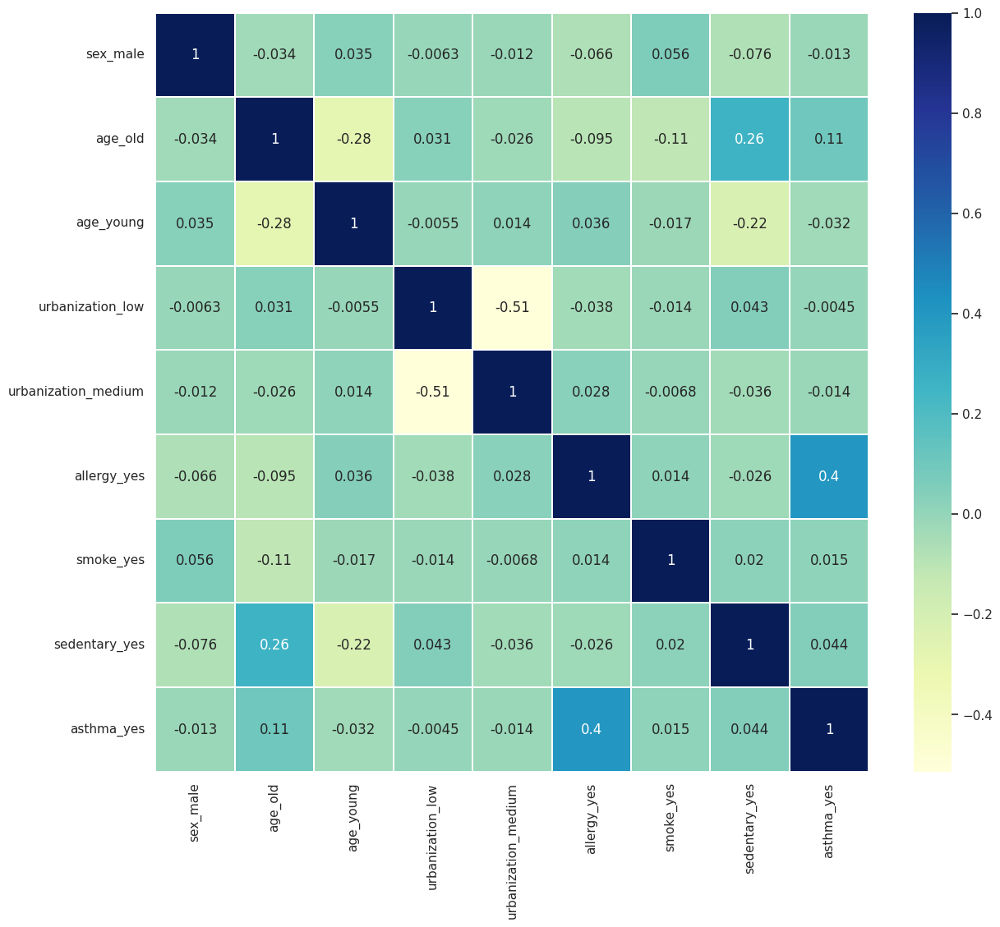

In [67]:
plt.figure(figsize=(14,12))
sns.heatmap(data3.corr(), linewidths=.1, cmap="YlGnBu", annot=True)
plt.yticks(rotation=0)

Distribution of each numerical column

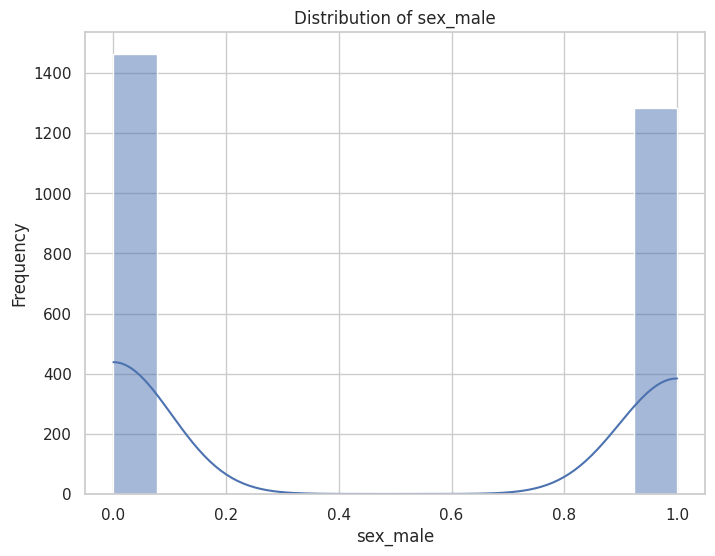

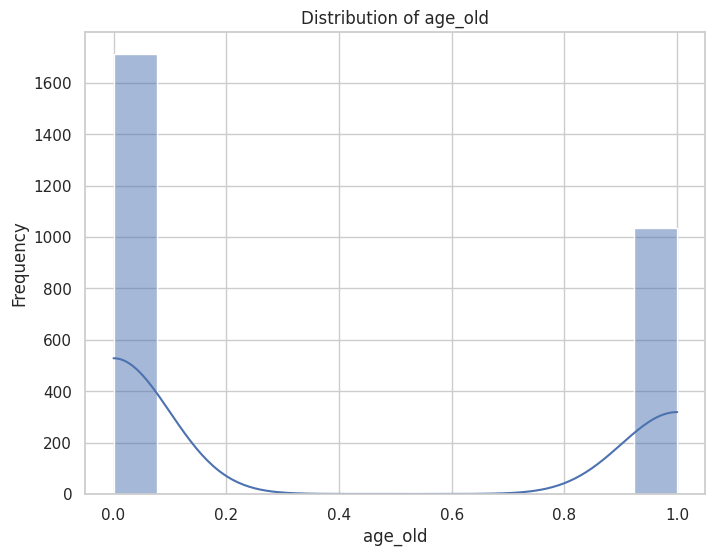

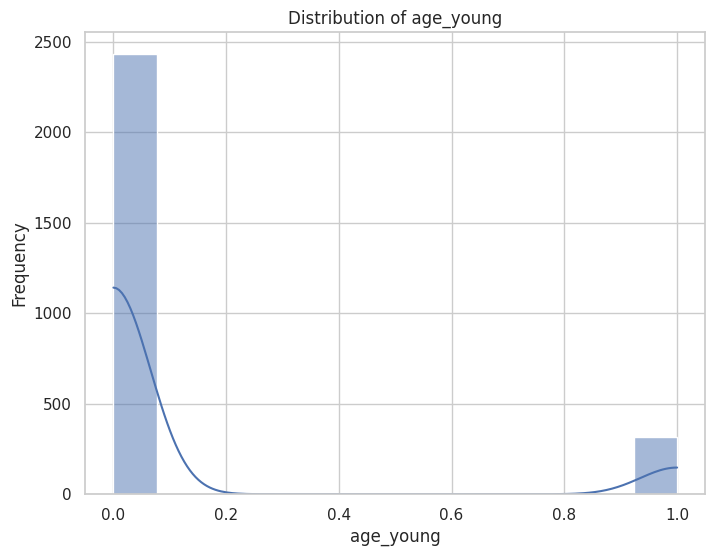

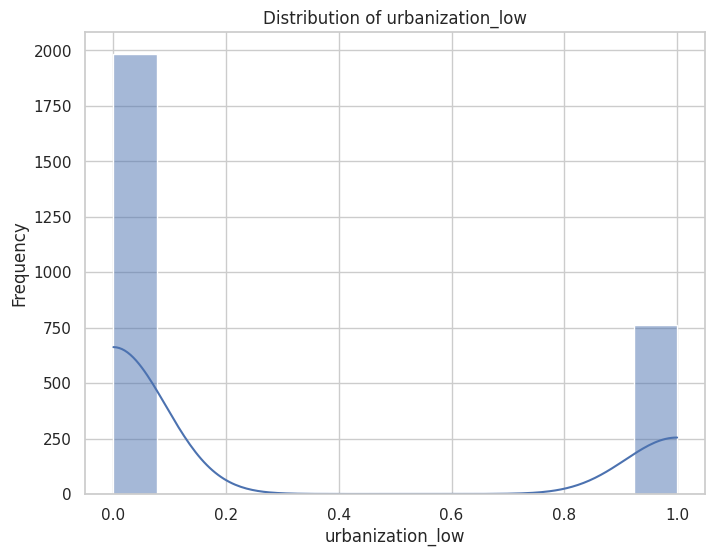

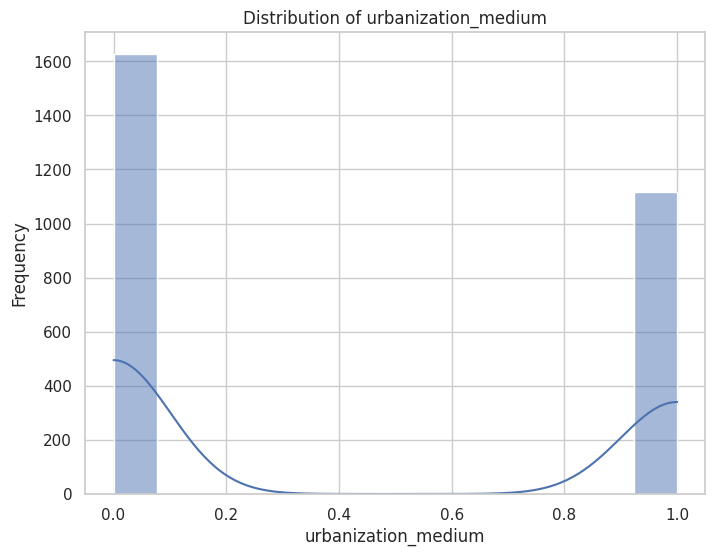

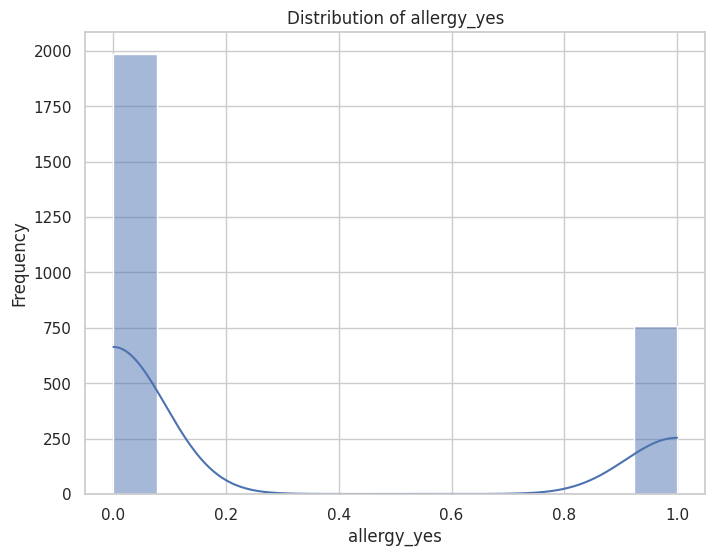

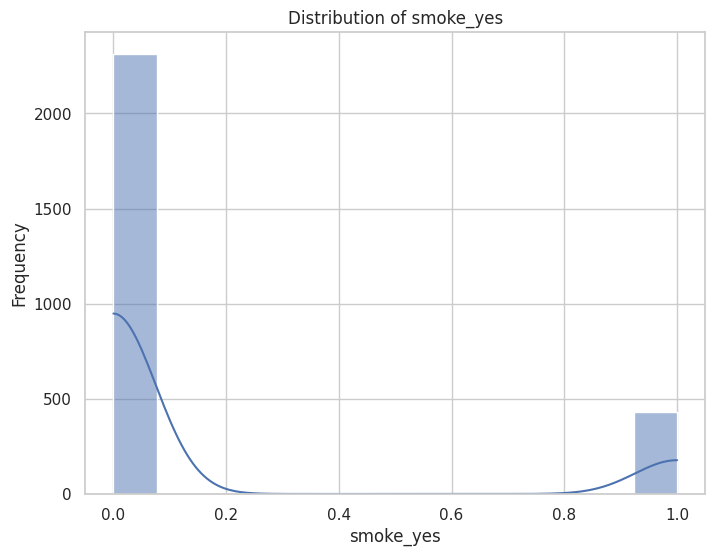

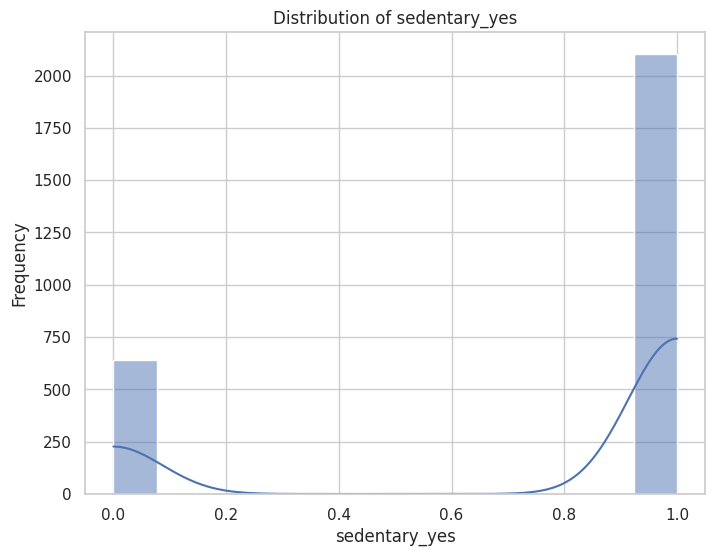

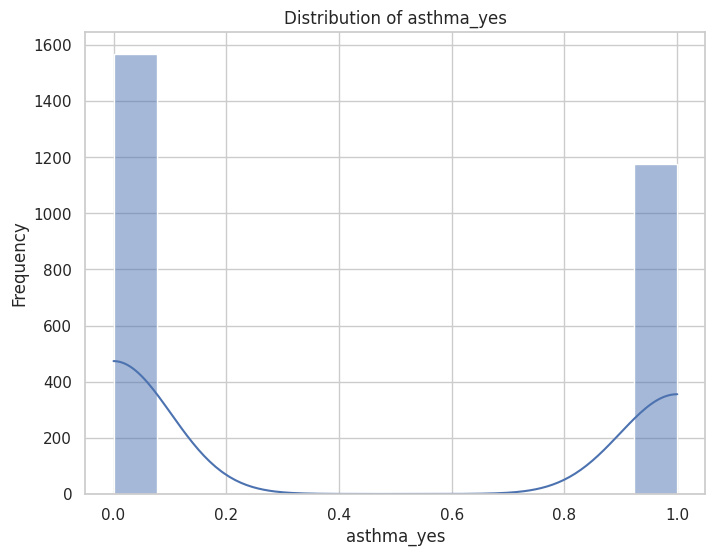

In [68]:
# Visualize the distribution of each numerical column
sns.set(style="whitegrid")

# Plot histograms of numerical columns
numerical_cols = data3.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(data3[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

Plotting Numerical columns to check for Outliers

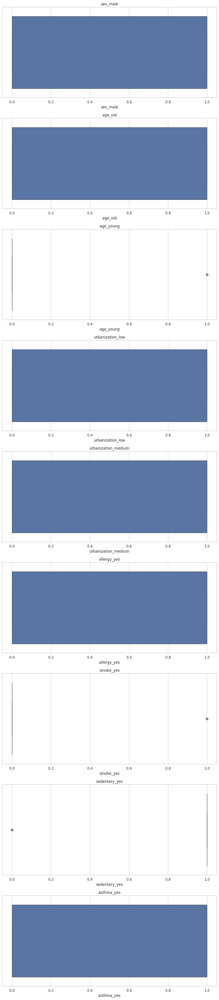

In [69]:
# Select numerical columns
numerical_columns = data3.select_dtypes(include=['float64', 'int64']).columns

# Create subplots for each numerical column
fig, axes = plt.subplots(nrows=len(numerical_columns), figsize=(10, 5*len(numerical_columns)))

# Plot box plots for each numerical column
for i, column in enumerate(numerical_columns):
    sns.boxplot(x=data3[column], ax=axes[i])
    axes[i].set_title(column)

plt.tight_layout()
plt.show()

# Merging Datasets

In [70]:
# Iterate through each column and display unique values
for column in data1.columns:
    unique_values = data1[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Tiredness
[1 0]

Column: Dry-Cough
[1 0]

Column: Difficulty-in-Breathing
[1 0]

Column: Sore-Throat
[1 0]

Column: None_Sympton
[0 1]

Column: Pains
[1 0]

Column: Runny-Nose
[1 0]

Column: None_Experiencing
[0 1]

Column: Age_0-9
[1 0]

Column: Age_10-19
[0 1]

Column: Age_20-24
[0 1]

Column: Age_25-59
[0 1]

Column: Age_60+
[0 1]

Column: Gender_Male
[1 0]

Column: Severity_Mild
[1 0]

Column: Severity_Moderate
[0 1]

Column: Severity_None
[0 1]



In [71]:
# Iterate through each column and display unique values
for column in data2.columns:
    unique_values = data2[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Age
[26 52 56 55 43 23 33 20 36 27 34 51 54 53 39 37 24 58 41 63 25 42 18 22
 19 65 59 57 45 62 21 48 47 50 64 38 28 46 49 60 32 30 29 44 31 61 35 40]

Column: Peak_Flow
[175 156 236 378 159 376 296 322 264 240 354 171 327 336 307 372 239 309
 323 160 286 282 248 325 233 346 379 207 168 200 386 257 349 273 260 249
 203 384 253 383 202 310 287 348 230 388 331 288 284 205 352 267 269 398
 259 258 194 157 382 151 321 176 270 389 280 397 212 300 294 358 198 263
 152 237 363 380 305 218 185 181 262 188 210 338 301 308 377 289 197 337
 385 281 268 316 162 232 184 182 215 276 357 390 295 261 254 226 381 150
 178 290 392 224 192 314 347 351 304 302 332 183 375 234 400 274 278 334
 364 199 251 169 245 277 320 329 217 333 241 189 373 297 391 196 161 172
 395 328 220 271 228 231 154 164 315 204 341 360 283 213 265 371 272 170
 177 206 330 225 211 229 387 187 243 340 293 362 350 345 367 208]

Column: Gender_Male
[0 1]

Column: Smoking_Status_Ex-Smoker
[0 1]

Column: Smoking_Status_Non-Smok

In [72]:
# Iterate through each column and display unique values
for column in data3.columns:
    unique_values = data3[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: sex_male
[1 0]

Column: age_old
[0 1]

Column: age_young
[0 1]

Column: urbanization_low
[1 0]

Column: urbanization_medium
[0 1]

Column: allergy_yes
[1 0]

Column: smoke_yes
[1 0]

Column: sedentary_yes
[1 0]

Column: asthma_yes
[1 0]



Creating a Column named Asthma_Diagnosis_Yes based on Severity data

In [73]:
# Create a new column 'Asthma_Diagnosis' based on the conditions
data1['Asthma_Diagnosis_Yes'] = (data1['Severity_Mild'] | data1['Severity_Moderate']).astype(int)
data1.loc[data1['Severity_None'] == 1, 'Asthma_Diagnosis_Yes'] = 0

# Print the modified DataFrame
print(data1)

        Tiredness  Dry-Cough  Difficulty-in-Breathing  Sore-Throat  \
0               1          1                        1            1   
1               1          1                        1            1   
2               1          1                        1            1   
3               1          1                        1            1   
4               1          1                        1            1   
...           ...        ...                      ...          ...   
314683          0          0                        0            0   
314684          0          0                        0            0   
314685          0          0                        0            0   
314686          0          0                        0            0   
314687          0          0                        0            0   

        None_Sympton  Pains  Runny-Nose  None_Experiencing  Age_0-9  \
0                  0      1           1                  0        1   
1                

Dropping Severity_Mild', 'Severity_Moderate', and 'Severity_None

In [74]:
# Drop the columns 'Severity_Mild', 'Severity_Moderate', and 'Severity_None'
data1.drop(columns=['Severity_Mild', 'Severity_Moderate', 'Severity_None'], inplace=True)

# Print the modified DataFrame
print(data1)

        Tiredness  Dry-Cough  Difficulty-in-Breathing  Sore-Throat  \
0               1          1                        1            1   
1               1          1                        1            1   
2               1          1                        1            1   
3               1          1                        1            1   
4               1          1                        1            1   
...           ...        ...                      ...          ...   
314683          0          0                        0            0   
314684          0          0                        0            0   
314685          0          0                        0            0   
314686          0          0                        0            0   
314687          0          0                        0            0   

        None_Sympton  Pains  Runny-Nose  None_Experiencing  Age_0-9  \
0                  0      1           1                  0        1   
1                

Splitting Dataset2 'Age' Column into Age groups for easier merging

In [75]:
# Create age group columns in Dataset 2
data2['Age_0-9'] = 0
data2['Age_10-19'] = 0
data2['Age_20-24'] = 0
data2['Age_25-59'] = 0
data2['Age_60+'] = 0

# Assign values based on age range
data2.loc[(data2['Age'] >= 0) & (data2['Age'] <= 9), 'Age_0-9'] = 1
data2.loc[(data2['Age'] >= 10) & (data2['Age'] <= 19), 'Age_10-19'] = 1
data2.loc[(data2['Age'] >= 20) & (data2['Age'] <= 24), 'Age_20-24'] = 1
data2.loc[(data2['Age'] >= 25) & (data2['Age'] <= 59), 'Age_25-59'] = 1
data2.loc[data2['Age'] >= 60, 'Age_60+'] = 1

# Drop the original 'Age' column if needed
data2.drop(columns=['Age'], inplace=True)

# Print the modified DataFrame
print(data2)

     Peak_Flow  Gender_Male  Smoking_Status_Ex-Smoker  \
0          175            0                         0   
1          156            0                         1   
2          236            0                         1   
3          378            1                         0   
4          159            0                         0   
..         ...          ...                       ...   
295        283            0                         0   
296        202            1                         1   
297        208            0                         0   
298        175            1                         1   
299        332            0                         0   

     Smoking_Status_Non-Smoker  Asthma_Diagnosis_Yes  Medication_Inhaler  \
0                            1                     1                   1   
1                            0                     0                   0   
2                            0                     1                   1   
3          

In [76]:
# Iterate through each column and display unique values
for column in data1.columns:
    unique_values = data1[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Tiredness
[1 0]

Column: Dry-Cough
[1 0]

Column: Difficulty-in-Breathing
[1 0]

Column: Sore-Throat
[1 0]

Column: None_Sympton
[0 1]

Column: Pains
[1 0]

Column: Runny-Nose
[1 0]

Column: None_Experiencing
[0 1]

Column: Age_0-9
[1 0]

Column: Age_10-19
[0 1]

Column: Age_20-24
[0 1]

Column: Age_25-59
[0 1]

Column: Age_60+
[0 1]

Column: Gender_Male
[1 0]

Column: Asthma_Diagnosis_Yes
[1 0]



In [77]:
# Iterate through each column and display unique values
for column in data2.columns:
    unique_values = data2[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Peak_Flow
[175 156 236 378 159 376 296 322 264 240 354 171 327 336 307 372 239 309
 323 160 286 282 248 325 233 346 379 207 168 200 386 257 349 273 260 249
 203 384 253 383 202 310 287 348 230 388 331 288 284 205 352 267 269 398
 259 258 194 157 382 151 321 176 270 389 280 397 212 300 294 358 198 263
 152 237 363 380 305 218 185 181 262 188 210 338 301 308 377 289 197 337
 385 281 268 316 162 232 184 182 215 276 357 390 295 261 254 226 381 150
 178 290 392 224 192 314 347 351 304 302 332 183 375 234 400 274 278 334
 364 199 251 169 245 277 320 329 217 333 241 189 373 297 391 196 161 172
 395 328 220 271 228 231 154 164 315 204 341 360 283 213 265 371 272 170
 177 206 330 225 211 229 387 187 243 340 293 362 350 345 367 208]

Column: Gender_Male
[0 1]

Column: Smoking_Status_Ex-Smoker
[0 1]

Column: Smoking_Status_Non-Smoker
[1 0]

Column: Asthma_Diagnosis_Yes
[1 0]

Column: Medication_Inhaler
[1 0]

Column: Medication_No Medication
[0 1]

Column: Age_0-9
[0]

Column: Age_10-19
[

Merging Dataset1 and Dataset2

In [78]:
# Merge datasets on common columns
merged_data = pd.merge(data1, data2, on=['Gender_Male', 'Asthma_Diagnosis_Yes', 'Age_0-9', 'Age_10-19', 'Age_20-24', 'Age_25-59', 'Age_60+'], how='inner')

# Print the merged DataFrame
print(merged_data)

         Tiredness  Dry-Cough  Difficulty-in-Breathing  Sore-Throat  \
0                1          1                        1            1   
1                1          1                        1            1   
2                1          1                        1            1   
3                1          1                        1            1   
4                1          1                        1            1   
...            ...        ...                      ...          ...   
3115123          0          0                        0            0   
3115124          0          0                        0            0   
3115125          0          0                        0            0   
3115126          0          0                        0            0   
3115127          0          0                        0            0   

         None_Sympton  Pains  Runny-Nose  None_Experiencing  Age_0-9  \
0                   0      1           1                  0        0   
1  

Modifying columns Age_0-9', 'Age_10-19', 'Age_20-24', 'Age_25-59', 'Age_60+ into Two columns Age_old and Age_young in merged_data

In [79]:
# Define a function to assign values to Age_old and Age_young columns based on age group
def assign_age_category(row):
    if row['Age_60+'] == 1:
        return 1, 0  # Age_old is 1 and Age_young is 0
    elif row['Age_0-9'] == 1 or row['Age_10-19'] == 1 or row['Age_20-24'] == 1:
        return 0, 1  # Age_old is 0 and Age_young is 1
    else:
        return 0, 0  # Age_old is 0 and Age_young is 0

# Apply the function to create Age_old and Age_young columns
merged_data[['Age_old', 'Age_young']] = merged_data.apply(assign_age_category, axis=1, result_type='expand')

# Drop the original age group columns if needed
merged_data.drop(columns=['Age_0-9', 'Age_10-19', 'Age_20-24', 'Age_25-59', 'Age_60+'], inplace=True)

# Print the modified DataFrame
print(merged_data)


         Tiredness  Dry-Cough  Difficulty-in-Breathing  Sore-Throat  \
0                1          1                        1            1   
1                1          1                        1            1   
2                1          1                        1            1   
3                1          1                        1            1   
4                1          1                        1            1   
...            ...        ...                      ...          ...   
3115123          0          0                        0            0   
3115124          0          0                        0            0   
3115125          0          0                        0            0   
3115126          0          0                        0            0   
3115127          0          0                        0            0   

         None_Sympton  Pains  Runny-Nose  None_Experiencing  Gender_Male  \
0                   0      1           1                  0            

Merging Smoking Staus Columns into a single column called smoke_yes in merged_ data

In [80]:
# Define a function to assign values to smoke_yes column based on Smoking_Status_Ex-Smoker and Smoking_Status_Non-Smoker columns
def assign_smoke_yes(row):
    if row['Smoking_Status_Ex-Smoker'] == 0 and row['Smoking_Status_Non-Smoker'] == 0:
        return 1  # smoke_yes is 1
    elif row['Smoking_Status_Ex-Smoker'] == 1 and row['Smoking_Status_Non-Smoker'] == 0:
        return 1  # smoke_yes is 1
    elif row['Smoking_Status_Ex-Smoker'] == 0 and row['Smoking_Status_Non-Smoker'] == 1:
        return 0  # smoke_yes is 0
    else:
        return None  # Handle other cases if any

# Apply the function to create smoke_yes column
merged_data['smoke_yes'] = merged_data.apply(assign_smoke_yes, axis=1)

# Print the modified DataFrame
print(merged_data)


         Tiredness  Dry-Cough  Difficulty-in-Breathing  Sore-Throat  \
0                1          1                        1            1   
1                1          1                        1            1   
2                1          1                        1            1   
3                1          1                        1            1   
4                1          1                        1            1   
...            ...        ...                      ...          ...   
3115123          0          0                        0            0   
3115124          0          0                        0            0   
3115125          0          0                        0            0   
3115126          0          0                        0            0   
3115127          0          0                        0            0   

         None_Sympton  Pains  Runny-Nose  None_Experiencing  Gender_Male  \
0                   0      1           1                  0            

Dropping the columns 'Smoking_Status_Ex-Smoker' and 'Smoking_Status_Non-Smoker

In [81]:
# Drop the columns 'Smoking_Status_Ex-Smoker' and 'Smoking_Status_Non-Smoker'
merged_data.drop(columns=['Smoking_Status_Ex-Smoker', 'Smoking_Status_Non-Smoker'], inplace=True)

# Print the modified DataFrame
print(merged_data)


         Tiredness  Dry-Cough  Difficulty-in-Breathing  Sore-Throat  \
0                1          1                        1            1   
1                1          1                        1            1   
2                1          1                        1            1   
3                1          1                        1            1   
4                1          1                        1            1   
...            ...        ...                      ...          ...   
3115123          0          0                        0            0   
3115124          0          0                        0            0   
3115125          0          0                        0            0   
3115126          0          0                        0            0   
3115127          0          0                        0            0   

         None_Sympton  Pains  Runny-Nose  None_Experiencing  Gender_Male  \
0                   0      1           1                  0            

In [82]:
# Iterate through each column and display unique values
for column in data3.columns:
    unique_values = data3[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: sex_male
[1 0]

Column: age_old
[0 1]

Column: age_young
[0 1]

Column: urbanization_low
[1 0]

Column: urbanization_medium
[0 1]

Column: allergy_yes
[1 0]

Column: smoke_yes
[1 0]

Column: sedentary_yes
[1 0]

Column: asthma_yes
[1 0]



In [83]:
# Iterate through each column and display unique values
for column in merged_data.columns:
    unique_values = merged_data[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Tiredness
[1 0]

Column: Dry-Cough
[1 0]

Column: Difficulty-in-Breathing
[1 0]

Column: Sore-Throat
[1 0]

Column: None_Sympton
[0 1]

Column: Pains
[1 0]

Column: Runny-Nose
[1 0]

Column: None_Experiencing
[0 1]

Column: Gender_Male
[1 0]

Column: Asthma_Diagnosis_Yes
[1 0]

Column: Peak_Flow
[183 375 176 384 243 287 249 175 200 161 213 322 205 308 376 333 337 204
 340 273 331 248 363 181 254 377 277 196 400 202 282 323 257 151 294 390
 280 224 373 172 217 253 272 262 160 378 281 182 271 231 320 327 372 309
 168 386 383 230 194 382 358 263 237 210 289 346 385 232 150 364 332 398
 351 352 349 170 212 330 211 198 300 367 264 354 239 325 233 260 284 267
 269 307 258 157 321 159 152 218 336 338 197 348 290 192 203 302 328 220
 360 265 371 225 270 187 286 293 236 171 207 310 389 397 305 188 316 357
 295 162 392 314 304 234 274 251 245 329 241 261 189 268 296 301 315 341
 184 334 206 350 156 240 388 288 259 380 185 215 276 226 381 178 278 199
 169 283 177 362 345 208 297 391 154 3

Renaming the data3 columns appropriately in sync with the merged_data

In [84]:
data3 = data3.rename(columns={'sex_male': 'Gender_Male', 'age_old': 'Age_old', 'age_young':'Age_young','asthma_yes': 'Asthma_Diagnosis_Yes'})

In [85]:
# Iterate through each column and display unique values
for column in data3.columns:
    unique_values = data3[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Gender_Male
[1 0]

Column: Age_old
[0 1]

Column: Age_young
[0 1]

Column: urbanization_low
[1 0]

Column: urbanization_medium
[0 1]

Column: allergy_yes
[1 0]

Column: smoke_yes
[1 0]

Column: sedentary_yes
[1 0]

Column: Asthma_Diagnosis_Yes
[1 0]



In [86]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3115128 entries, 0 to 3115127
Data columns (total 16 columns):
 #   Column                    Dtype
---  ------                    -----
 0   Tiredness                 int64
 1   Dry-Cough                 int64
 2   Difficulty-in-Breathing   int64
 3   Sore-Throat               int64
 4   None_Sympton              int64
 5   Pains                     int64
 6   Runny-Nose                int64
 7   None_Experiencing         int64
 8   Gender_Male               int64
 9   Asthma_Diagnosis_Yes      int64
 10  Peak_Flow                 int64
 11  Medication_Inhaler        int64
 12  Medication_No Medication  int64
 13  Age_old                   int64
 14  Age_young                 int64
 15  smoke_yes                 int64
dtypes: int64(16)
memory usage: 380.3 MB


In [87]:
merged_data.duplicated().sum()

3097908

In [88]:
data3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2745 entries, 0 to 2754
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Gender_Male           2745 non-null   int64
 1   Age_old               2745 non-null   int64
 2   Age_young             2745 non-null   int64
 3   urbanization_low      2745 non-null   int64
 4   urbanization_medium   2745 non-null   int64
 5   allergy_yes           2745 non-null   int64
 6   smoke_yes             2745 non-null   int64
 7   sedentary_yes         2745 non-null   int64
 8   Asthma_Diagnosis_Yes  2745 non-null   int64
dtypes: int64(9)
memory usage: 214.5 KB


In [89]:
merged_data = merged_data.drop_duplicates()
print(f"No. of Duplcate rows after deleting duplicate rows: {merged_data.duplicated().sum()}")

No. of Duplcate rows after deleting duplicate rows: 0


Merging the merged_data and Dataset3 into Final Data

In [90]:
# Assuming 'merged_data' and 'dataset3' are your DataFrames

# Merge datasets on common columns
final_data = pd.merge(merged_data, data3, on=['Gender_Male', 'Asthma_Diagnosis_Yes', 'Age_old', 'Age_young', 'smoke_yes'], how='inner')

# Print the merged DataFrame
print(final_data)


         Tiredness  Dry-Cough  Difficulty-in-Breathing  Sore-Throat  \
0                1          1                        1            1   
1                1          1                        1            1   
2                1          1                        1            1   
3                1          1                        1            1   
4                1          1                        1            1   
...            ...        ...                      ...          ...   
2020975          0          0                        0            0   
2020976          0          0                        0            0   
2020977          0          0                        0            0   
2020978          0          0                        0            0   
2020979          0          0                        0            0   

         None_Sympton  Pains  Runny-Nose  None_Experiencing  Gender_Male  \
0                   0      1           1                  0            

In [91]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2020980 entries, 0 to 2020979
Data columns (total 20 columns):
 #   Column                    Dtype
---  ------                    -----
 0   Tiredness                 int64
 1   Dry-Cough                 int64
 2   Difficulty-in-Breathing   int64
 3   Sore-Throat               int64
 4   None_Sympton              int64
 5   Pains                     int64
 6   Runny-Nose                int64
 7   None_Experiencing         int64
 8   Gender_Male               int64
 9   Asthma_Diagnosis_Yes      int64
 10  Peak_Flow                 int64
 11  Medication_Inhaler        int64
 12  Medication_No Medication  int64
 13  Age_old                   int64
 14  Age_young                 int64
 15  smoke_yes                 int64
 16  urbanization_low          int64
 17  urbanization_medium       int64
 18  allergy_yes               int64
 19  sedentary_yes             int64
dtypes: int64(20)
memory usage: 308.4 MB


# Exploratory Data Analysis

In [93]:
# Display summary statistics for numerical columns
summary_stats = final_data.describe()
print(summary_stats)

          Tiredness  Dry-Cough  Difficulty-in-Breathing   Sore-Throat  \
count  2.020980e+06  2020980.0                2020980.0  2.020980e+06   
mean   3.333333e-01        0.5                      0.5  3.333333e-01   
std    4.714046e-01        0.5                      0.5  4.714046e-01   
min    0.000000e+00        0.0                      0.0  0.000000e+00   
25%    0.000000e+00        0.0                      0.0  0.000000e+00   
50%    0.000000e+00        0.5                      0.5  0.000000e+00   
75%    1.000000e+00        1.0                      1.0  1.000000e+00   
max    1.000000e+00        1.0                      1.0  1.000000e+00   

       None_Sympton         Pains    Runny-Nose  None_Experiencing  \
count  2.020980e+06  2.020980e+06  2.020980e+06          2020980.0   
mean   8.333333e-02  4.000000e-01  4.000000e-01                0.2   
std    2.763855e-01  4.898981e-01  4.898981e-01                0.4   
min    0.000000e+00  0.000000e+00  0.000000e+00               

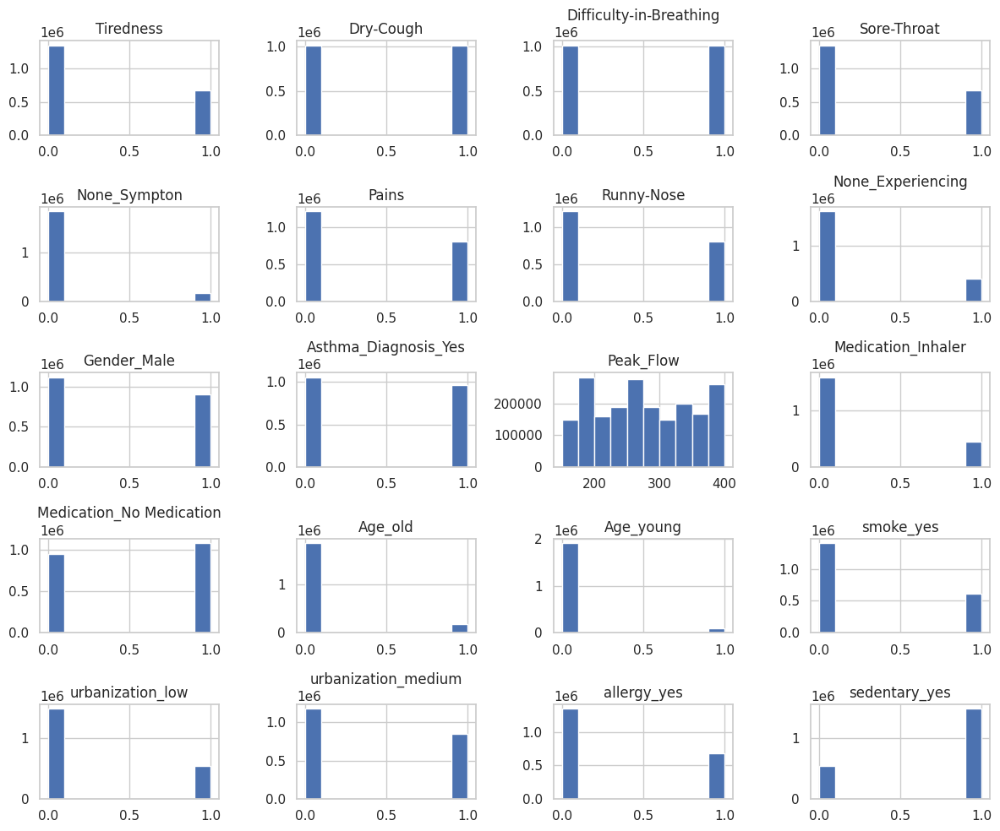

In [94]:
# Plot histograms of numerical columns
final_data.hist(figsize=(12, 10))
plt.tight_layout()
plt.show()

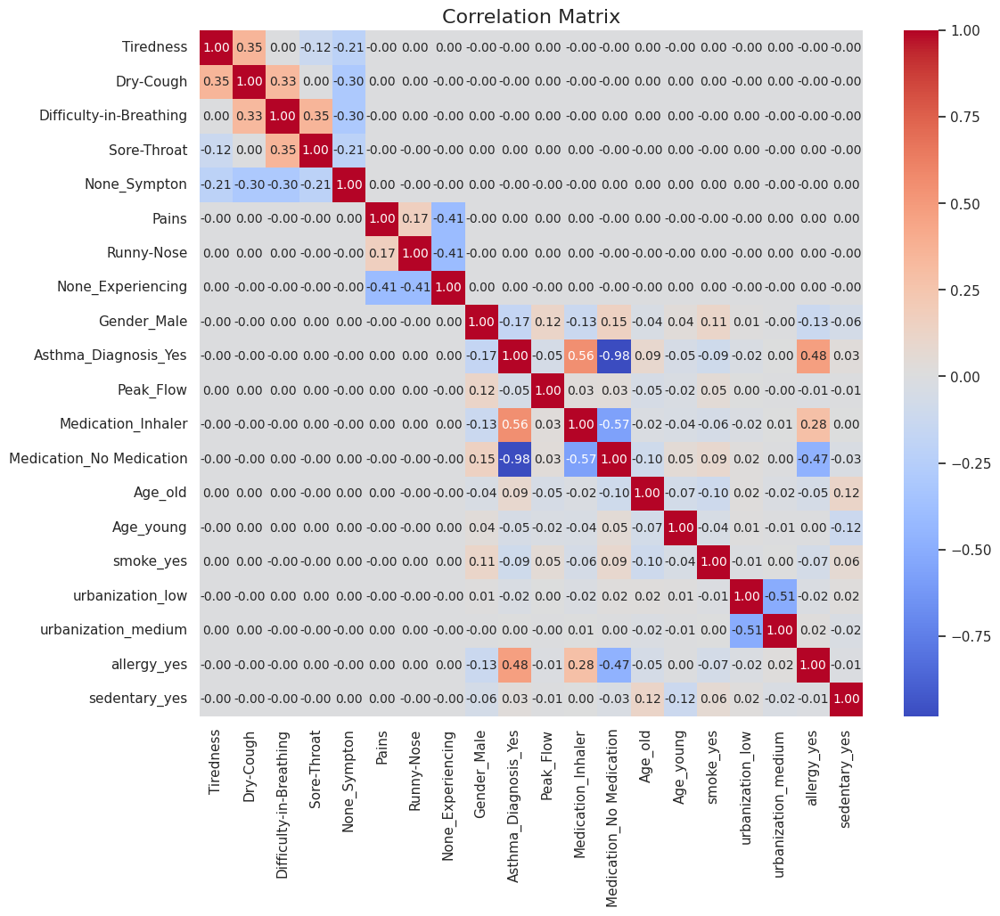

In [95]:
corr_matrix = final_data.corr()

# Plot correlation matrix as a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title("Correlation Matrix", fontsize=16)
plt.show()

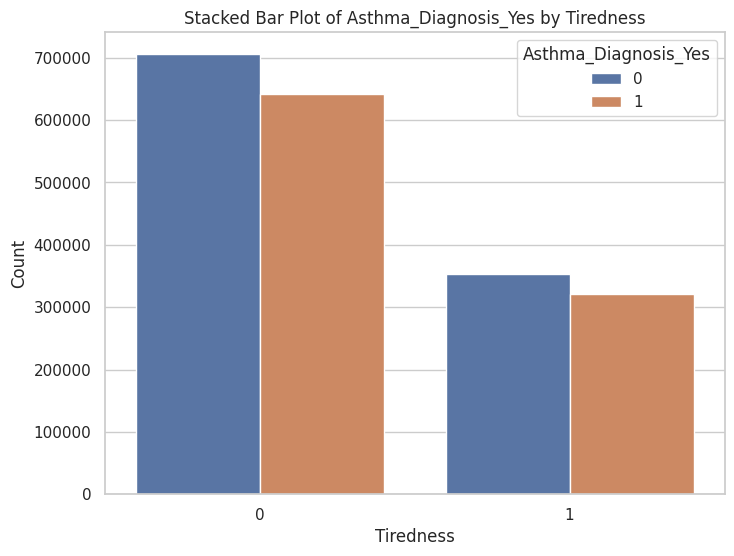

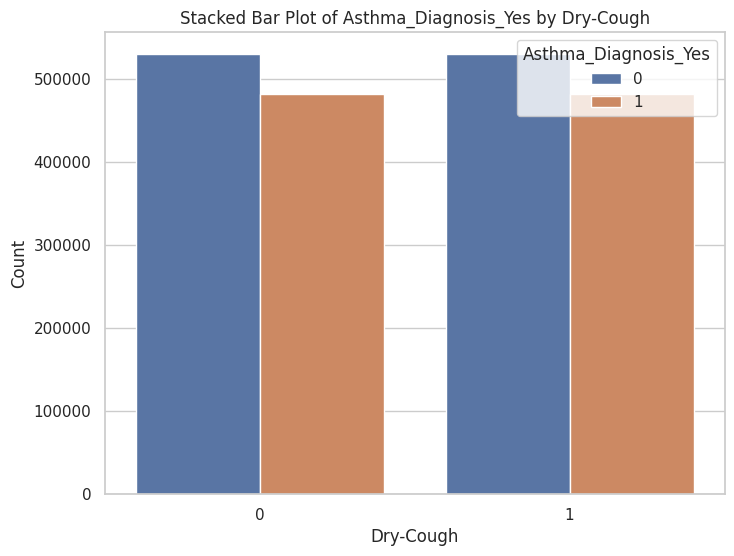

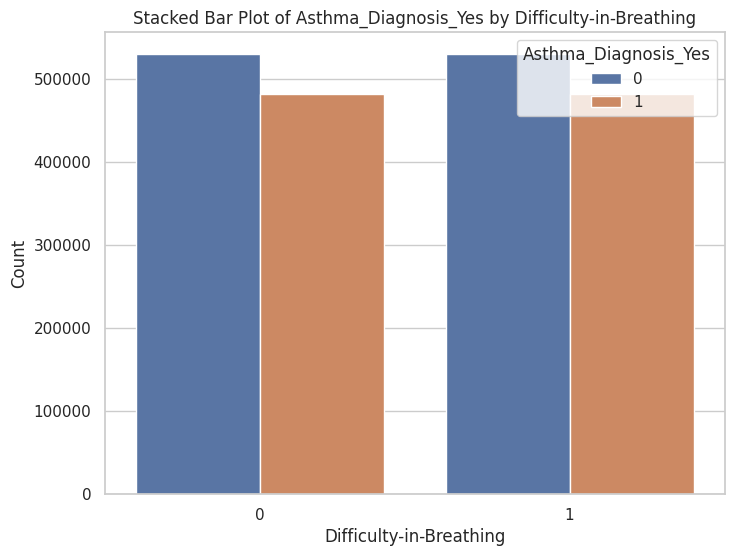

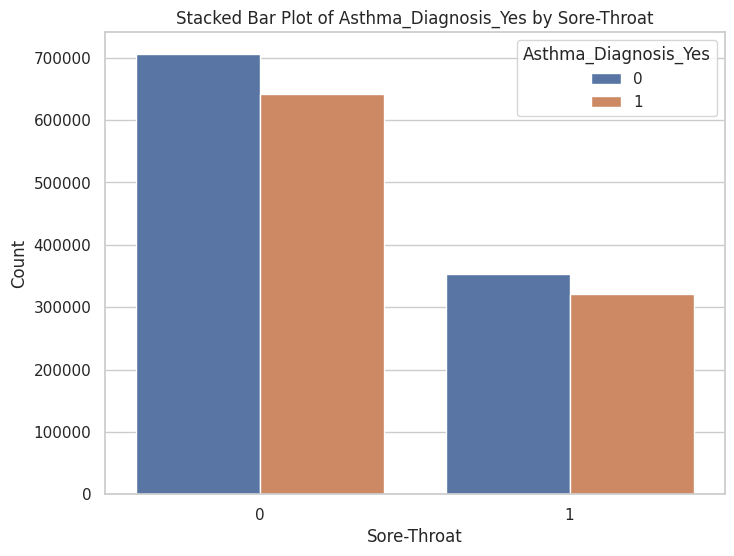

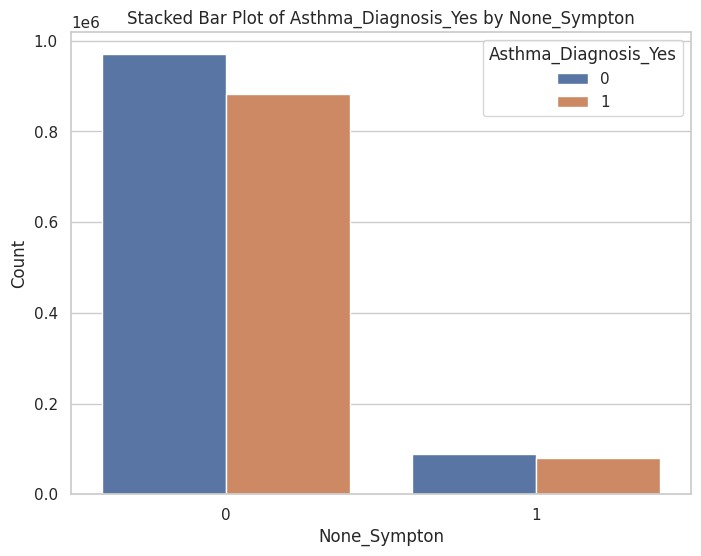

...

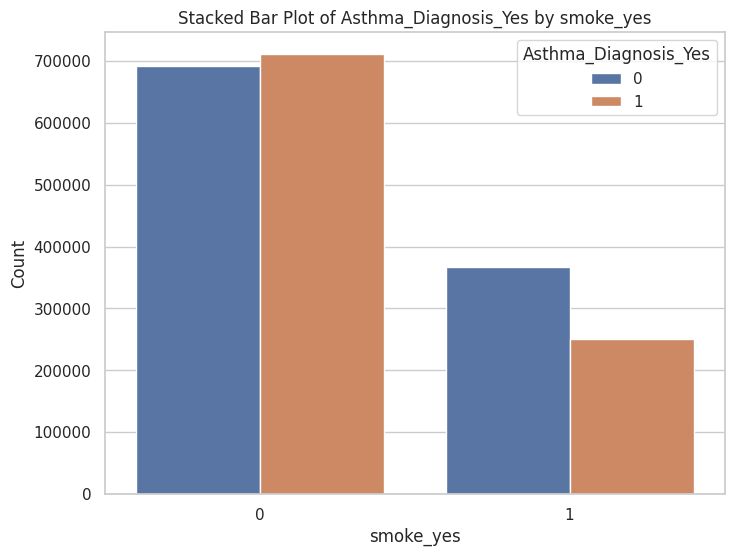

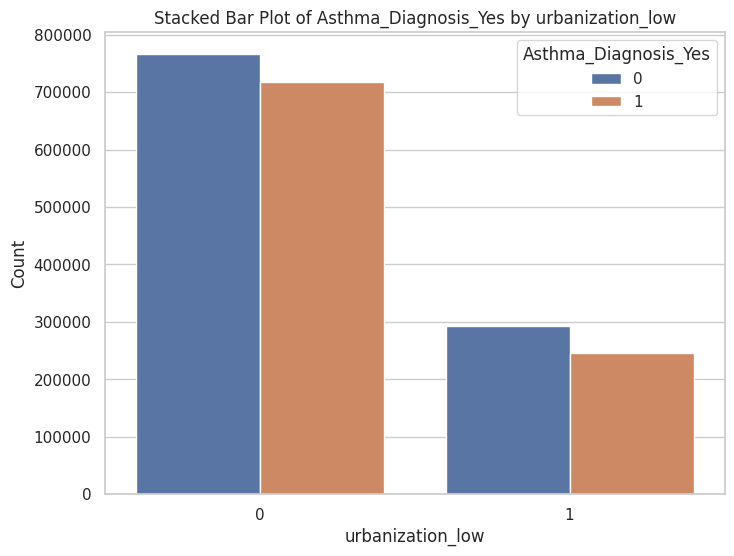

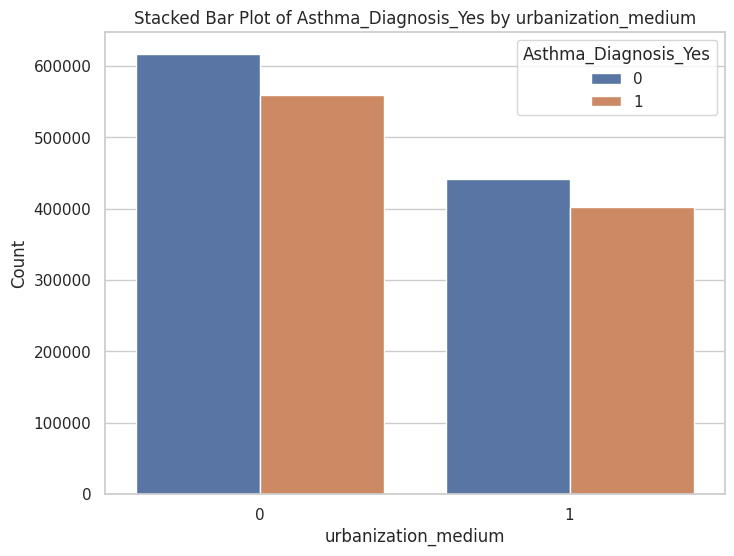

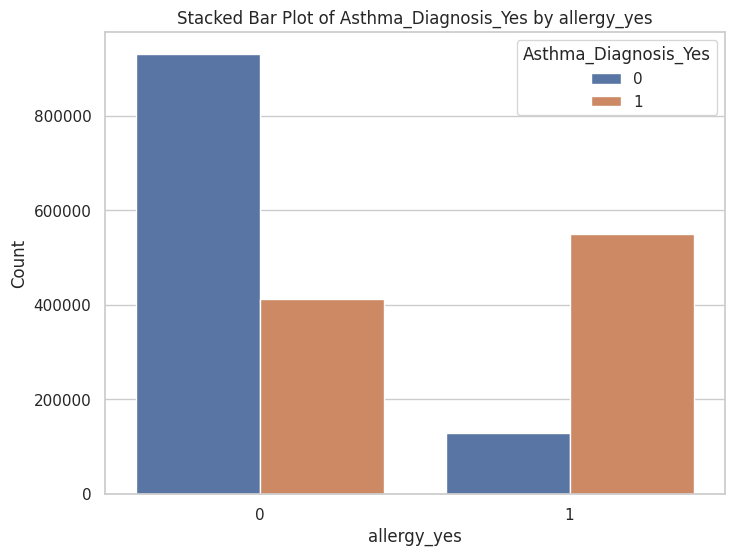

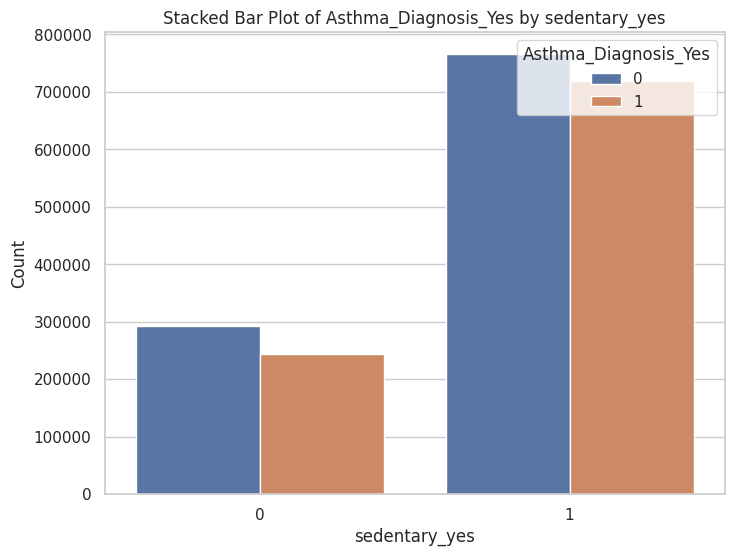

In [96]:
# Select numerical columns
numerical_columns = final_data.select_dtypes(include=['int64', 'float64']).columns

# Plot stacked bar plots for each numerical column
for col in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=col, hue='Asthma_Diagnosis_Yes', data=final_data)
    plt.title(f'Stacked Bar Plot of Asthma_Diagnosis_Yes by {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.legend(title='Asthma_Diagnosis_Yes', loc='upper right')
    plt.show()

In [100]:
import plotly.express as px

px.violin(final_data,
             x='Difficulty-in-Breathing',
             y='smoke_yes',
             title='Difficulty-in-Breathing Vs smoke_yes',
             color='Asthma_Diagnosis_Yes')

# Decision Tree

In [101]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

# Step 1: Train-Test Split
X = final_data.drop(columns=['Asthma_Diagnosis_Yes'])  # Features
y = final_data['Asthma_Diagnosis_Yes']  # Target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 2: Train Decision Tree Classifier
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

# Step 3: Predict
y_pred = clf.predict(X_test)

# Step 4: Evaluate
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Step 5: Error Analysis (Optional)
# You can perform error analysis by examining misclassified instances, analyzing feature importances, etc.


Accuracy: 0.9987580282833081

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    211475
           1       1.00      1.00      1.00    192721

    accuracy                           1.00    404196
   macro avg       1.00      1.00      1.00    404196
weighted avg       1.00      1.00      1.00    404196



Feature Importance Analysis

In [102]:
# Feature importance
feature_importance = clf.feature_importances_
print("Feature Importance:")
for i, feature in enumerate(X.columns):
    print(f"{feature}: {feature_importance[i]}")


Feature Importance:
Tiredness: 8.09045900400801e-06
Dry-Cough: 7.494848737919614e-06
Difficulty-in-Breathing: 1.1703105344372058e-05
Sore-Throat: 1.0736146940838307e-05
None_Sympton: 2.4643008168114028e-06
Pains: 7.2160705476747645e-06
Runny-Nose: 9.54690939724265e-06
None_Experiencing: 4.193497346916564e-06
Gender_Male: 2.9327891044886363e-05
Peak_Flow: 0.023633039227146116
Medication_Inhaler: 0.0
Medication_No Medication: 0.9679220538616269
Age_old: 0.0
Age_young: 0.0
smoke_yes: 0.008105682033823034
urbanization_low: 2.5036085983051366e-05
urbanization_medium: 8.055939141845724e-05
allergy_yes: 0.000126375657174997
sedentary_yes: 1.6480513646865335e-05


Cross-Validation

In [104]:
from sklearn.model_selection import cross_val_score

# Perform 5-fold cross-validation
cv_scores = cross_val_score(clf, X, y, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", cv_scores.mean())


Cross-Validation Scores: [1.         1.         0.99340914 0.99198409 0.99486883]
Mean CV Score: 0.9960524102168256


Hyperparameter Tuning

In [105]:
from sklearn.model_selection import GridSearchCV

# Define parameter grid
param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Perform grid search
grid_search = GridSearchCV(clf, param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Use the best estimator for prediction
best_clf = grid_search.best_estimator_
y_pred_best = best_clf.predict(X_test)


Best Parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}


Model Deployment

In [106]:
import joblib

# Save the trained model
joblib.dump(best_clf, 'decision_tree_model.pkl')

# Load the trained model for prediction
loaded_model = joblib.load('decision_tree_model.pkl')


In [108]:
# Step 5: Error Analysis
misclassified_indices = y_test[y_test != y_pred].index

if len(misclassified_indices) > 0:
    # Extract misclassified instances from X_test and y_test
    misclassified_instances = X_test.loc[misclassified_indices]
    true_labels = y_test.loc[misclassified_indices]
    predicted_labels = y_pred[y_test != y_pred]

    # Display misclassified instances along with true and predicted labels
    misclassified_df = pd.DataFrame({'True Label': true_labels, 'Predicted Label': predicted_labels})
    misclassified_df = pd.concat([misclassified_instances, misclassified_df], axis=1)
    print("Misclassified Instances:")
    print(misclassified_df)
else:
    print("No misclassified instances.")


Misclassified Instances:
         Tiredness  Dry-Cough  Difficulty-in-Breathing  Sore-Throat  \
1293548          1          1                        0            0   
1312622          1          0                        0            0   
1417179          1          1                        1            1   
1353054          0          1                        0            0   
1319759          0          0                        0            0   
...            ...        ...                      ...          ...   
1331626          0          1                        1            1   
1413136          1          1                        1            1   
1447383          1          0                        0            0   
1329232          0          1                        1            1   
1300691          1          1                        0            0   

         None_Sympton  Pains  Runny-Nose  None_Experiencing  Gender_Male  \
1293548             0      1           1      

In [1]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Calculate MAE, MSE, and RMSE
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

# Print the error metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


NameError: name 'y_test' is not defined